In [3]:
%load_ext autoreload
%autoreload 2
    
import os
import math
import pickle
import urbanity as urb

import h3
import pandas as pd
import geopandas as gpd
import geodatasets
import matplotlib.pyplot as plt
import folium
from shapely import wkt
from shapely.geometry import Polygon, MultiPolygon
from folium import GeoJson

from ipywidgets import HBox, Output
from IPython.display import IFrame, display

import community_utils
import graph_stats_utils
import networkx as nx
import numpy as np
import seaborn as sns
import contextily as ctx
import xyzservices.providers as xyz

from typing import Dict, Any
from scipy.stats import entropy, wasserstein_distance, zscore
from graph_eda import *

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

/home/srg/projects/urbanity/src/urbanity/urbanity.py:19: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
/home/srg/projects/urbanity/.venv/lib/python3.10/site-packages/pkg_resources/__init__.py:3147: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(pkg)
/home/srg/projects/urbanity/.venv/lib/python3.10/site-packages/pkg_resources/__init__.py:3147: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('sphinxcontrib')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespac

# Introduction to the data:

## Main data is related to road networks (intersections and edges) belonging to some cities 

In [4]:
import pandas as pd
df = pd.read_csv("cities_full.csv")
print("Available cities = \n", df[['City', 'Country']])

Available cities = 
               City        Country
0        Singapore      Singapore
1          Bangkok       Thailand
2            Paris         France
3          Seattle            USA
4          Chicago            USA
5          Sapporo          Japan
6           Taipei         Taiwan
7           Mexico         Mexico
8            Tokyo          Japan
9           Denver            USA
10         Antwerp        Belgium
11       Barcelona          Spain
12       Amsterdam    Netherlands
13          Zagreb        Croatia
14         Toronto         Canada
15        Adelaide      Australia
16          Madrid          Spain
17          Athens         Greece
18          Berlin        Germany
19           Milan          Italy
20           Hanoi        Vietnam
21         Glasgow       Scotland
22       Edinburgh       Scotland
23          Bogota       Colombia
24         SanJose     Costa Rica
25        Budapest        Hungary
26        Yokohama          Japan
27          Zurich     Swit

Some data for some of the cities is not available/used due to corrupt source files, too large size or due to change in storage location from source

In [5]:
city_files = {}
for idx, row in df.iterrows():
    city = row.City.strip().replace('Switerland', 'Switzerland')
    country = row.Country.strip().replace('Switerland', 'Switzerland')
    if country == "USA":
        country = "United States"
    if os.path.exists("data/"+city+'_subzone.geojson'):
        file = "data/"+city+'_subzone.geojson'
    else:
        continue
    city_files[(city, country)] = file

In [6]:
city_maps = {}
for (city, country), file in city_files.items():
    if country == 'Scotland':
        continue
    m = urb.Map(country, zoom=4)
    m.add_polygon_boundary(file)
    city_maps[(city, country)] = m.polygon_bounds.geometry.values[0]

In [7]:
# Load world data as GeoDataFrame
url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)

# fig, axes = plt.subplots(1, 5, figsize=(35, 6))
ct = 0
folium_maps = {}
for (city, country) in city_maps:
    try:
        country_map = world[(world.NAME == country)]
        country_vis = folium.Map(
            location=[city_maps[(city, country)].centroid.y,
                      city_maps[(city, country)].centroid.x],
            zoom_start=8
        )
        title_html = f'''
             <h3 align="center" style="font-size:20px"><b>{city} Map</b></h3>
             '''
        country_vis.get_root().html.add_child(folium.Element(title_html))
        if country_map.shape[0] == 0:
            continue
        folium.GeoJson(country_map.__geo_interface__, name=country).add_to(country_vis)
        geo_df = gpd.GeoDataFrame({'geometry': [city_maps[(city, country)]]}, crs="EPSG:4326")
        GeoJson(geo_df, name=city, style_function=lambda x: {'color': 'red'}).add_to(country_vis)
        folium_maps[(city, country)] = country_vis
    except Exception as e:
        print(e)
        continue
    ct += 1
    if ct >= 3:
        break

In [8]:
os.makedirs("map_htmls", exist_ok=True)
outs = []
for (city, country), m in folium_maps.items():
    m.save(f"map_htmls/{city}_{country}.html")
    display(IFrame(f"map_htmls/{city}_{country}.html", width=300, height=200))

## Each node has attributes aggregated around 100 meter buffer

In [9]:
bern_nodes = gpd.read_file("data/Bern_nodes_100m.geojson")
bern_nodes.describe()

,node_id,osmid,x,y,Node Density,Street Length,Degree,Clustering,Clustering (Weighted),Closeness Centrality,...,Green View Mean,Green View Stdev,Sky View Mean,Sky View Stdev,Building View Mean,Building View Stdev,Road View Mean,Road View Stdev,Visual Complexity Mean,Visual Complexity Stdev
count,8384.000000,8.384000e+03,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,...,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000
mean,4191.500000,2.257787e+09,7.433205,46.949903,12.833015,1621.900823,2.484017,0.039103,0.000914,0.027928,...,0.229925,0.107581,0.159460,0.090045,0.103539,0.074428,0.253433,0.103990,1.658918,0.199103
std,2420.396662,2.656434e+09,0.033715,0.011126,6.220262,589.204403,1.001124,0.112855,0.003658,0.004102,...,0.110967,0.050091,0.104464,0.053435,0.084369,0.049298,0.095323,0.052915,0.260347,0.082419
min,0.000000,6.245620e+05,7.305489,46.924194,1.000000,199.761000,1.000000,0.000000,0.000000,0.016000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2095.750000,4.892949e+08,7.414411,46.941341,8.000000,1234.042000,1.000000,0.000000,0.000000,0.025000,...,0.159634,0.070859,0.087394,0.049302,0.035292,0.033076,0.205112,0.065911,1.588503,0.144160
50%,4191.500000,8.037707e+08,7.438856,46.947626,12.000000,1620.711500,3.000000,0.000000,0.000000,0.028000,...,0.230667,0.112755,0.137167,0.084372,0.089500,0.073500,0.243000,0.106965,1.685108,0.215864
75%,6287.250000,3.323315e+09,7.459989,46.957054,17.000000,1956.708000,3.000000,0.000000,0.000000,0.030000,...,0.287333,0.145122,0.212753,0.121173,0.149000,0.107800,0.298000,0.138320,1.789303,0.247286
max,8383.000000,1.075569e+10,7.491268,46.988673,40.000000,5328.565000,7.000000,1.000000,0.094000,0.044000,...,0.709000,0.424264,0.587891,0.332340,0.555750,0.408708,0.700000,0.391737,2.213751,0.597322


In [10]:
bern_nodes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8384 entries, 0 to 8383
Data columns (total 48 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   node_id                  8384 non-null   int32   
 1   osmid                    8384 non-null   int64   
 2   x                        8384 non-null   float64 
 3   y                        8384 non-null   float64 
 4   Node Density             8384 non-null   int32   
 5   Street Length            8384 non-null   float64 
 6   Degree                   8384 non-null   int32   
 7   Clustering               8384 non-null   float64 
 8   Clustering (Weighted)    8384 non-null   float64 
 9   Closeness Centrality     8384 non-null   float64 
 10  Betweenness Centrality   8384 non-null   float64 
 11  Eigenvector Centrality   8384 non-null   float64 
 12  Katz Centrality          8384 non-null   float64 
 13  PageRank                 8384 non-null   float64 
 14  

Each node has an ID, Open street maps ID, x and y geo-coordinates, the aggregated length of connected streets, graph related atributes such as degree, centrality coefficient, clustering coefficients etc and statistics related to establishments, buildings and street view image attributes in a 100 meter radius.

## Each edges has some attributes based on 50 meter buffer distance adjacent to it

In [11]:
bern_edges = gpd.read_file("data/Bern_edges_100m.geojson")
bern_edges.describe()

,edge_id,u,v,length,Footprint Total,Footprint Mean,Footprint Stdev,Complexity Mean,Complexity Stdev,Perimeter Total,...,Green View Mean,Green View Stdev,Sky View Mean,Sky View Stdev,Building View Mean,Building View Stdev,Road View Mean,Road View Stdev,Visual Complexity Mean,Visual Complexity Stdev
count,20826.000000,2.082600e+04,2.082600e+04,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,...,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000,20826.000000
mean,10412.500000,2.082320e+09,2.082320e+09,66.796069,433.739905,195.138827,58.340653,9.300247,1.209486,107.839072,...,0.229502,0.216737,0.166803,0.161122,0.105273,0.100111,0.242032,0.228149,1.651606,1.540691
std,6012.092689,2.582497e+09,2.582497e+09,101.717020,961.742901,654.450552,239.168742,10.114022,2.760105,179.162426,...,0.081265,0.075060,0.088040,0.083387,0.064427,0.052701,0.066462,0.065164,0.226371,0.439983
min,0.000000,6.245620e+05,6.245620e+05,0.170000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5206.250000,3.549844e+08,3.549844e+08,22.700750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.190887,0.190887,0.125348,0.125348,0.057922,0.057922,0.225967,0.219433,1.625638,1.606092
50%,10412.500000,7.043674e+08,7.043674e+08,40.897000,85.757000,52.967500,0.000000,10.917000,0.000000,41.474500,...,0.232522,0.232522,0.138124,0.134196,0.109697,0.109697,0.240642,0.236465,1.673162,1.668576
75%,15618.750000,2.996871e+09,2.996871e+09,75.016000,503.085000,181.977750,34.955000,15.684250,1.287750,155.478250,...,0.255211,0.255211,0.202753,0.202753,0.128831,0.128831,0.261941,0.253238,1.727900,1.719099
max,20825.000000,1.075569e+10,1.075569e+10,2097.826000,33620.469000,33620.469000,10279.947000,104.034000,61.226000,3701.717000,...,0.709000,0.479846,0.661000,0.476817,0.656000,0.362039,0.700000,0.612545,2.443833,1.818649


In [12]:
bern_edges.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20826 entries, 0 to 20825
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   edge_id                  20826 non-null  int32   
 1   u                        20826 non-null  int64   
 2   v                        20826 non-null  int64   
 3   length                   20826 non-null  float64 
 4   Footprint Total          20826 non-null  float64 
 5   Footprint Mean           20826 non-null  float64 
 6   Footprint Stdev          20826 non-null  float64 
 7   Complexity Mean          20826 non-null  float64 
 8   Complexity Stdev         20826 non-null  float64 
 9   Perimeter Total          20826 non-null  float64 
 10  Perimeter Mean           20826 non-null  float64 
 11  Perimeter Stdev          20826 non-null  float64 
 12  Building Count           20826 non-null  int32   
 13  PopSum                   20826 non-null  int32   
 14

Each node has an ID, start and end nodes' IDs, the length of the street, and statistics related to establishments, buildings and street view image attributes in a 50 meter distance.

## Each graph has street intersection as nodes and edges as streets

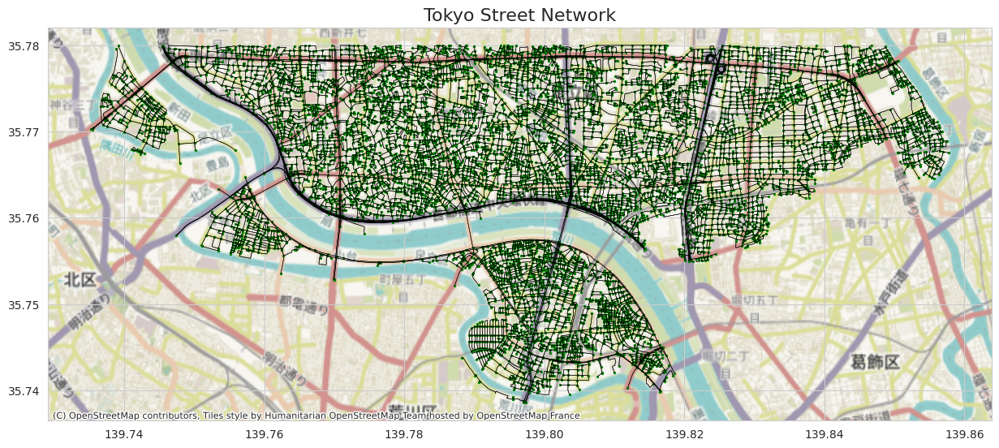

In [13]:
edge_gdf = gpd.read_file("data/Tokyo_edges_100m.geojson")
city_computed_metadata = pickle.load(open("saved_data/Tokyo.pkl", "rb"))
network, intersection, streets = city_computed_metadata[
    'network'], city_computed_metadata['intersection'], city_computed_metadata[
        'street']

fig, ax = plt.subplots(figsize=(15, 15))
intersection.plot(ax=ax, color='green', markersize=2)
streets.plot(ax=ax, color='black', linewidth=0.4)
ctx.add_basemap(ax, crs=edge_gdf.crs)
plt.title("Tokyo Street Network", fontsize=16)

plt.show()

# Visualizations and statistics

## Node level stats

We can use features available for each intersection, and also aggregate them, to get information about it's nearby region. For example, here's a population pyramid aggregated for a city using the population values available near a node.

In [14]:
def plot_population_pyramids_grid(nodes_attr_dict, n_cols=2):
    """
    Create a grid of population pyramid plots for different cities or zones.
    
    Parameters:
    nodes_attr_dict : dict
        Dictionary with city/zone names as keys and dataframes containing demographic data as values
    n_cols : int
        Number of columns in the grid layout
    """
    # Calculate grid dimensions
    n_cities = len(nodes_attr_dict)
    n_rows = math.ceil(n_cities / n_cols)

    # Create figure and axes
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 5 * n_rows))

    # Flatten axes if there are multiple plots
    if n_cities > 1:
        axes = axes.flatten()
    else:
        axes = [axes]

    # Process each city/zone
    for i, (city_name, nodes_attr) in enumerate(nodes_attr_dict.items()):
        if i >= len(axes):
            break

        # Extract city demographic data
        city_data = nodes_attr[['Children', 'Youth', 'Elderly', 'Men', 'Women']].copy()

        # Define age groups
        age_groups = ['Babies', 'Kids', 'Adults', 'Old']
        city_data['Babies'] = city_data['Children']
        city_data['Kids'] = city_data['Youth']
        city_data['Old'] = city_data['Elderly']
        city_data['Adults'] = city_data['Men'] + city_data['Women'] - (
            city_data['Babies'] + city_data['Kids'] + city_data['Old'])

        # Use actual Men/Women population
        male_pop = city_data[age_groups].multiply(city_data['Men'] / (city_data['Men'] + city_data['Women']), axis=0).sum()
        female_pop = city_data[age_groups].multiply(city_data['Women'] / (city_data['Men'] + city_data['Women']), axis=0).sum()

        # Convert male_pop to negative for proper pyramid alignment
        male_pop = -male_pop

        # Get current axis
        ax = axes[i]

        # Plot population pyramid
        y = np.arange(len(age_groups))
        ax.barh(y, male_pop, color='#2E8B57', label='Male', align='center', edgecolor='black', alpha=0.7)
        ax.barh(y, female_pop, color='#87CEFA', label='Female', align='center', edgecolor='black', alpha=0.7)

        ax.set_yticks(y)
        ax.set_yticklabels(age_groups, fontsize=10, fontweight='bold')
        ax.set_xlim(left=male_pop.min() * 1.2, right=female_pop.max() * 1.2)  # Ensuring symmetric x-axis range

        # Add total population at the ends of bars
        for j, (m_val, f_val) in enumerate(zip(male_pop, female_pop)):
            ax.text(m_val - (0.05 * abs(male_pop.min())), j, f'{int(abs(m_val))}',
                    va='center', ha='right', color='black', fontsize=8, fontweight='bold', rotation=90)
            ax.text(f_val + (0.05 * abs(female_pop.max())), j, f'{int(f_val)}',
                    va='center', ha='left', color='black', fontsize=8, fontweight='bold', rotation=90)

        ax.set_title(f'{city_name} Population Pyramid',  fontsize=12,  fontweight='bold')

        # Only add legend to the first plot
        if i == 0:
            ax.legend(frameon=False, fontsize=10)

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('gray')
        ax.spines['bottom'].set_color('gray')
        ax.grid(axis='x', linestyle='--', alpha=0.6)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.title("Population Pyramids comparing age and gender of different cities", fontsize=16)
    plt.show()

    return fig

In [15]:
node_dfs = {
    'Amsterdam': gpd.read_file("data/Amsterdam_nodes_100m.geojson"),
    'New York': gpd.read_file("data/New York_nodes_100m.geojson"),
    'Hanoi': gpd.read_file("data/Hanoi_nodes_100m.geojson"),
    'Tokyo': gpd.read_file("data/Tokyo_nodes_100m.geojson"),
}

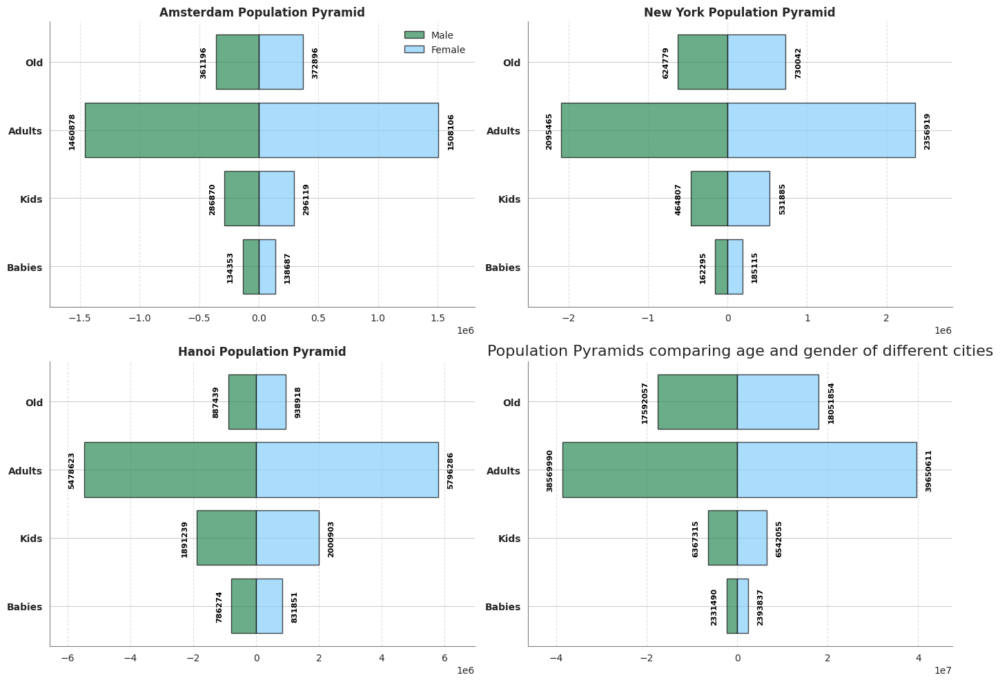

In [16]:
f = plot_population_pyramids_grid(node_dfs, n_cols=2)

We can also do intra city node analysis. We can use correlation matrix to see which features are similar for all nodes across city. If we see high correlation for a feature among nodes, that indicates homogeneity for that feature across the city

In [17]:
city_computed_metadata = pickle.load(open("saved_data/Taipei.pkl", "rb"))
network, intersection, streets = city_computed_metadata[
    'network'], city_computed_metadata['intersection'], city_computed_metadata[
        'street']

def plot_node_correlation(I, city_name):
    columns_of_interest = [
        'intersection_mean_GreenView',  # Green View
        'PopSum',                      # Population Sum
        'Civic',                       # Civic amenities
        'Commercial',                  # Commercial amenities
        'Entertainment',               # Entertainment amenities
        'Food',                        # Food amenities
        'Healthcare',                  # Healthcare amenities
        'Institutional',               # Institutional amenities
        'Recreational',                # Recreational amenities
        'Social'                       # Social amenities
    ]

    df_subset = intersection[columns_of_interest]
    # Compute correlation matrix
    correlation_matrix = df_subset.corr()

    # Mask the diagonal (self-correlation)
    correlation_matrix = correlation_matrix.rename(columns={'intersection_mean_GreenView': 'GreenView'}, index={'intersection_mean_GreenView': 'GreenView'})
    # Set up the matplotlib figure
    plt.figure(figsize=(10, 8))

    # Create a heatmap
    heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

    # Plot histogram of node weights

    # Add title and labels
    plt.title(f"Correlation Matrix: Green View, PopSum, and Amenities. ({city_name})")
    plt.show()

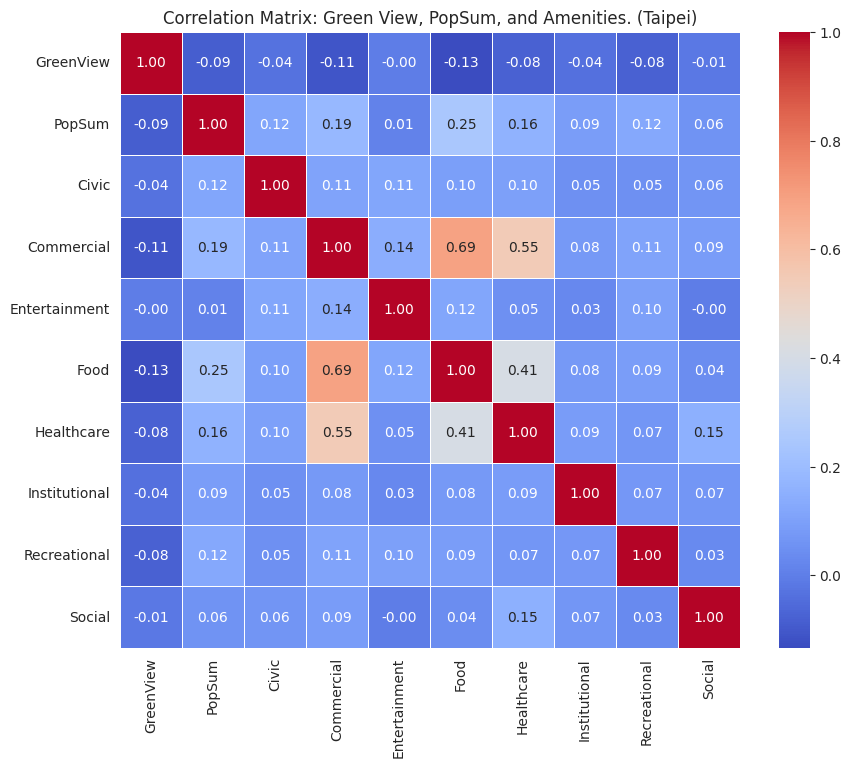

In [18]:
plot_node_correlation(intersection, "Taipei")

Here we can see that Food and Cmmercial establishments have a correlation, and is applicable across the city. Which indicates in most intersections of a city, Food and Commercial establishments are nearby each other.

## Edge stats

Similar to nodes, edges have their own features. They also include features like length, indicating the length of the street and green view, indicating the greenery seen across the length of the street. It also contains information of buildings around it and how complex the buildings are from an aerial view.

In [19]:
edge_gdf = gpd.read_file("data/Washington_edges_100m.geojson")

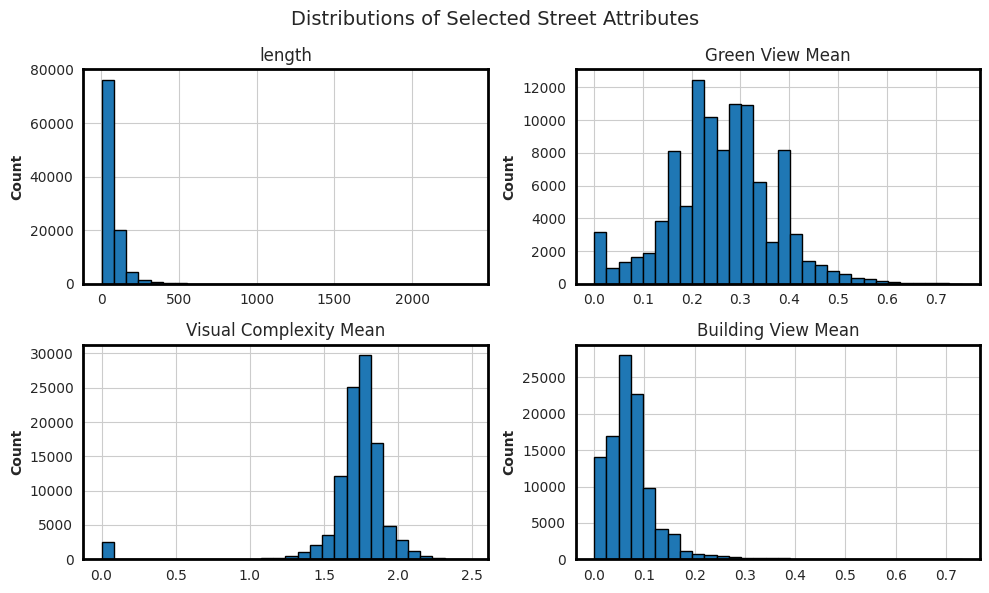

In [20]:
# attribute list
attributes_to_plot = ["length", "Green View Mean", "Visual Complexity Mean", "Building View Mean"]

# Histograms
axes = edge_gdf[attributes_to_plot].hist(figsize=(10, 6), bins=30, edgecolor="black")
# Add thick black borders to each subplot
for ax_row in axes:
    for ax in ax_row:
        # Add thick black borders
        for spine in ax.spines.values():
            spine.set_linewidth(2.0)
            spine.set_color('black')
        
        # Improve appearance
        ax.set_xlabel(ax.get_xlabel(), fontweight='bold')
        ax.set_ylabel('Count', fontweight='bold')
plt.suptitle("Distributions of Selected Street Attributes", fontsize=14)
plt.tight_layout()
plt.show()

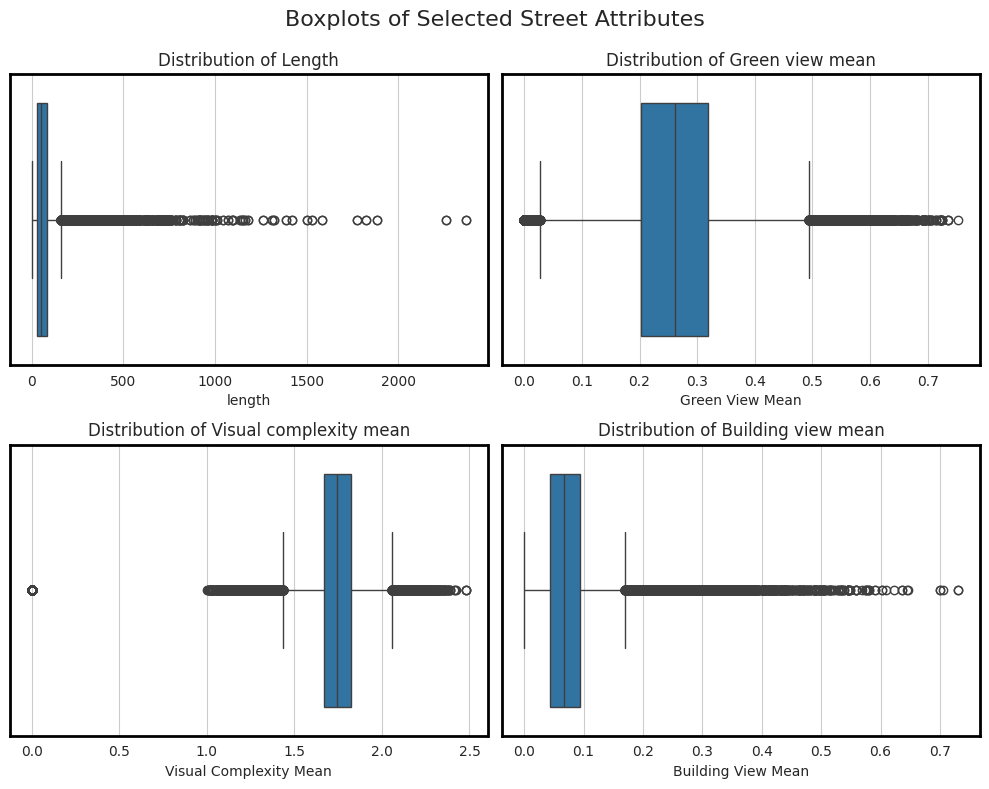

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for i, attribute in enumerate(attributes_to_plot):
    if i < len(axes):
        sns.boxplot(data=edge_gdf[[attribute]], orient="h", ax=axes[i])
        axes[i].set_title(f"Distribution of {attribute.capitalize()}")
        axes[i].set_xlabel(attribute)
        axes[i].set_ylabel("")
        axes[i].set_yticklabels([])
        for spine in axes[i].spines.values():
            spine.set_linewidth(2.0)
            spine.set_color('black')

plt.suptitle("Boxplots of Selected Street Attributes", fontsize=16, y=0.98)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.9)

### Composite Index & Outlier Detection in edges

We can combine multiple attributes into a single metric to rank or categorize street edges.

In [22]:
from sklearn.preprocessing import MinMaxScaler

composite_features = ["Green View Mean", "Visual Complexity Mean"]
weights = [0.5, 0.5]  # Adjust weights as desired

# Scale features to 0-1
scaler = MinMaxScaler()
scaled = scaler.fit_transform(edge_gdf[composite_features].fillna(0))

composite_index = np.zeros(len(edge_gdf))
for i, w in enumerate(weights):
    composite_index += scaled[:, i] * w

edge_gdf["Composite_Index"] = composite_index
edge_gdf["Composite_Index"].describe()

count    103424.000000
mean          0.517111
std           0.101655
min           0.000000
25%           0.486465
50%           0.536249
75%           0.568588
max           0.722689
Name: Composite_Index, dtype: float64

In [23]:
# Combine multiple attributes for outlier detection
outlier_features = ["length", "Green View Mean", "Visual Complexity Mean"]
zdf = edge_gdf[outlier_features].apply(zscore).abs()
edge_gdf["combined_z"] = zdf.sum(axis=1)

threshold = 6  # tune threshold
outliers = edge_gdf[edge_gdf["combined_z"] > threshold]

print("Number of outliers:", len(outliers))
outliers.head(5)

Number of outliers: 3282


,edge_id,u,v,length,Footprint Total,Footprint Mean,Footprint Stdev,Complexity Mean,Complexity Stdev,Perimeter Total,...,Sky View Stdev,Building View Mean,Building View Stdev,Road View Mean,Road View Stdev,Visual Complexity Mean,Visual Complexity Stdev,geometry,Composite_Index,combined_z
21,21,937305437,49184747,10.313,0.000,0.000,0.000,0.000,0.000,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"LINESTRING (-77.09826 38.95099, -77.09817 38.9...",0.0,8.907367
22,22,937305437,3946841403,123.884,928.261,132.609,92.475,13.442,2.434,315.223,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"LINESTRING (-77.09826 38.95099, -77.09869 38.9...",0.0,8.905179
23,23,937305437,3743632774,63.305,146.027,146.027,0.000,16.673,0.000,57.958,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"LINESTRING (-77.09826 38.95099, -77.09838 38.9...",0.0,8.181642
24,24,3798943074,4046741774,61.233,237.140,118.570,30.354,13.563,1.339,89.521,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"LINESTRING (-77.08036 38.96496, -77.08086 38.9...",0.0,8.210018
26,26,3798943074,1387045610,219.411,421.353,210.677,77.091,16.935,1.586,128.769,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"LINESTRING (-77.08036 38.96496, -77.08125 38.9...",0.0,10.213419


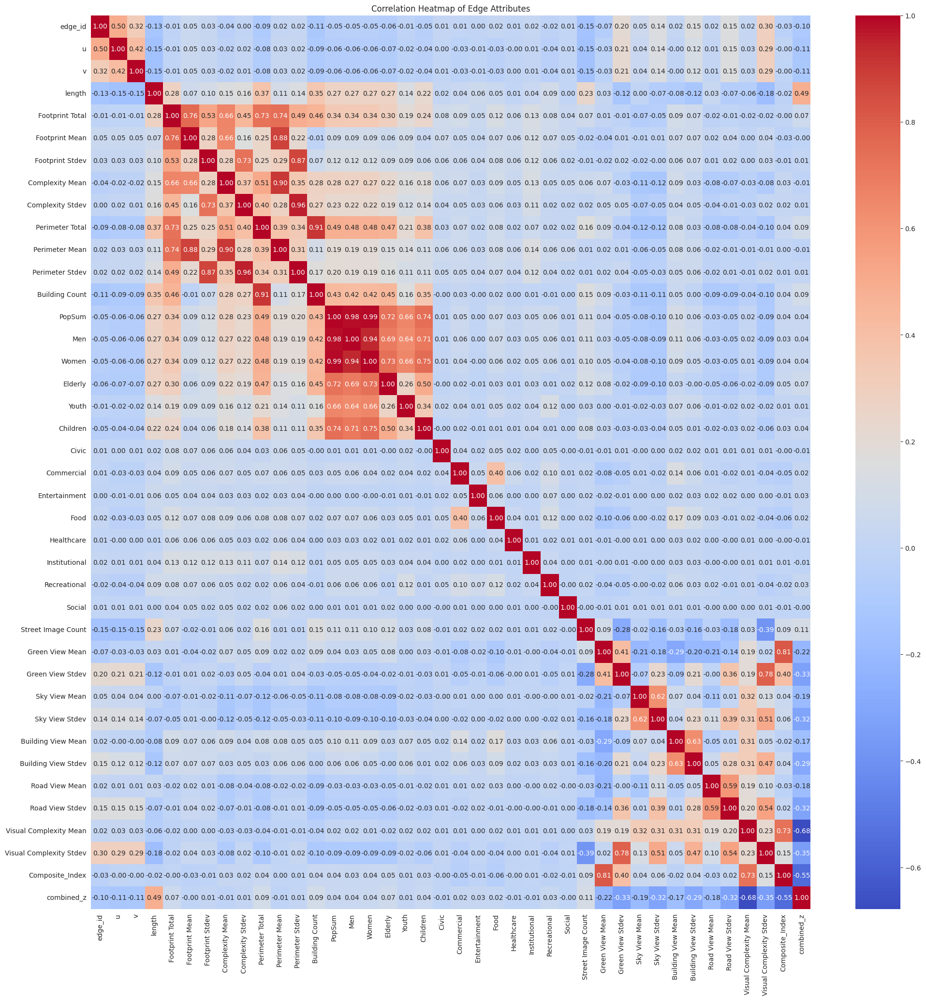

In [24]:
# Correlation Heatmap
num_cols = edge_gdf.select_dtypes(include=["float", "int"]).columns
corr = edge_gdf[num_cols].corr()
plt.figure(figsize=(24, 24))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Edge Attributes")
plt.show()

## Graph related stats

Graphs have their own descriptive statistics, such as number of nodes, degree of nodes, centrality of the nodes, average centrality of all nodes, number of triangles, number of cliques etc. which give us information about the attributes of different nodes. Using this, we can measure frequent patterns in graphs, homophily of nodes, community behavious among nodes etc.

We can use these features as inputs to any other algorithms for graph machine learning as well.

In [25]:
graph_dict = {}
graph_files = list(os.listdir("saved_data"))
np.random.shuffle(graph_files)
for file in graph_files:
    if len(graph_dict) >= 20:
        break
    if file.endswith(".pkl") and '_' in file:
        with open(f"saved_data/{file}", "rb") as f:
            city_subzone = file.split('_')[0] + '_' + file.split('_')[1]
            network = pickle.load(f)['network']
            if network is None or len(network.nodes) > 1000:
                continue
            graph_dict[city_subzone] = network
print(len(graph_dict))

20


In [26]:
df_stats = aggregate_stats_for_subzones(graph_dict)

In [27]:
df_stats.head()

,Subzone,max_degree,min_degree,avg_degree,shortest_path,avg_centrality,density,eulerian,clique,connected_components,num_triangles,diameter,avg_clustering,efficiency,local_efficiency,avg_shortest_path,avg_eccentricity,radius,total_triads,triad_percentage
0,Melbourne_Kensington.pkl,8,2,5.197674,13.54063,0.015154,0.007577,True,389,1,26.0,34,0.078004,0.10303,0.079457,13.54063,25.142442,17,6725544,0.093863
1,Melbourne_Caulfield.pkl,8,2,5.197674,13.54063,0.015154,0.007577,True,389,1,26.0,34,0.078004,0.10303,0.079457,13.54063,25.142442,17,6725544,0.093863
2,Amsterdam_Frankendael.pkl,8,2,5.432432,8.130263,0.036955,0.018478,True,175,1,11.0,19,0.064189,0.16642,0.064189,8.130263,15.054054,12,529396,0.0825
3,Chicago_North Park.pkl,10,2,4.897561,9.584075,0.024008,0.012004,True,234,1,9.0,23,0.033984,0.139413,0.038049,9.584075,17.326829,12,1414910,0.054435
4,Bern_Innere Stadt.pkl,10,2,5.07563,18.450367,0.014257,0.007129,True,400,1,23.0,61,0.057983,0.088692,0.061313,18.450367,42.795518,31,7519610,0.084455


In [28]:
df_stats.describe()

,Subzone,max_degree,min_degree,avg_degree,shortest_path,avg_centrality,density,eulerian,clique,connected_components,num_triangles,diameter,avg_clustering,efficiency,local_efficiency,avg_shortest_path,avg_eccentricity,radius,total_triads,triad_percentage
count,20,20,20,20.000000,20.00000,20.000000,20.000000,20,20,20,20.0,20,20.000000,20.00000,20.000000,20.00000,20.000000,20,20,20.000000
unique,20,2,1,6.000000,6.00000,6.000000,6.000000,1,6,1,6.0,6,6.000000,6.00000,6.000000,6.00000,6.000000,5,6,6.000000
top,Melbourne_Kensington.pkl,8,2,5.197674,13.54063,0.015154,0.007577,True,389,1,26.0,34,0.078004,0.10303,0.079457,13.54063,25.142442,12,6725544,0.093863
freq,1,13,20,5.000000,5.00000,5.000000,5.000000,20,5,20,5.0,5,5.000000,5.00000,5.000000,5.00000,5.000000,9,5,5.000000


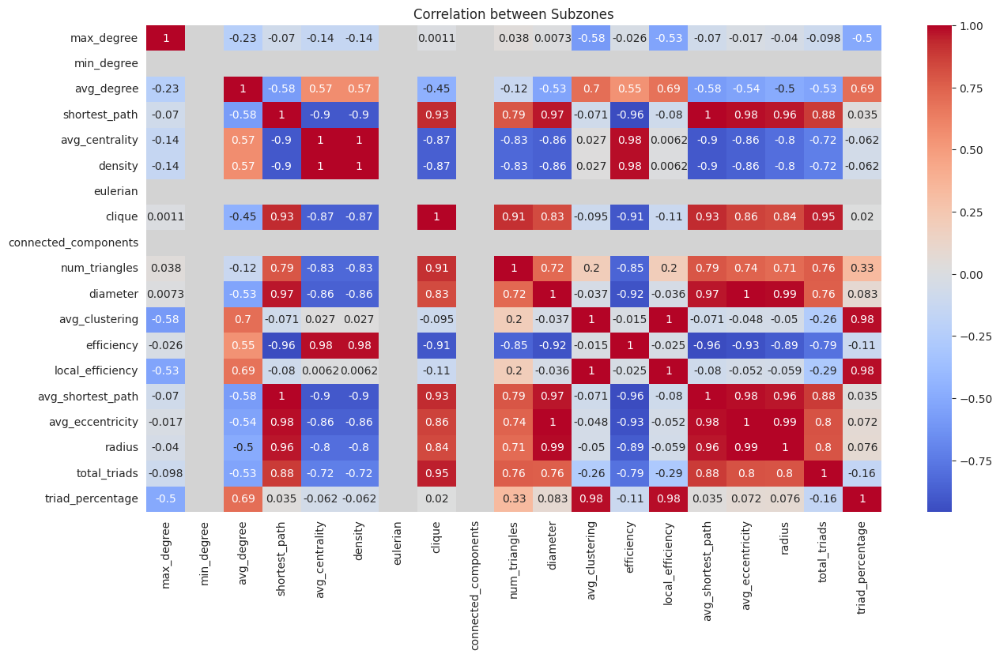

In [29]:
plt.figure(figsize=(15, 8))
plot_subzone_correlation(df_stats.drop(columns=["Subzone"]))

Grey columns/rows indicate no unique values => No information available, hence we can drop these. A lot of the features can be derived from other features. Hence we can see high correlation among a lot of the features.

We can get distributions of different attributes to get an idea about how intersections or streets are built/structured in the city or a region. For example, in Melbourne's sub zone, majority of the intersections have 6 streets connecting to it!

In [31]:
graph_dict.keys()

dict_keys(['Melbourne_Kensington.pkl', 'Melbourne_Caulfield.pkl', 'Amsterdam_Frankendael.pkl', 'Chicago_North Park.pkl', 'Bern_Innere Stadt.pkl', 'Amsterdam_Burgwallen-Nieuwe Zijde.pkl', 'Budapest_Budapest XXI. kerület.pkl', 'Chicago_Sauganash,Forest Glen.pkl', 'Amsterdam_Grachtengordel-West.pkl', 'Budapest_Budapest VI. kerület.pkl', 'Brisbane_Darra—Oxley district neighbourhood plan.pkl', 'Amsterdam_Schinkelbuurt.pkl', 'Amsterdam_Duivelseiland.pkl', 'Melbourne_Caulfield East.pkl', 'Melbourne_South Yarra.pkl', 'Brisbane_Pinkenba—Eagle Farm neighbourhood plan.pkl', 'Brisbane_Sandgate Road neighbourhood plan.pkl', 'Melbourne_Tottenham.pkl', 'Chicago_Wicker Park.pkl', 'Chicago_South Deering.pkl'])

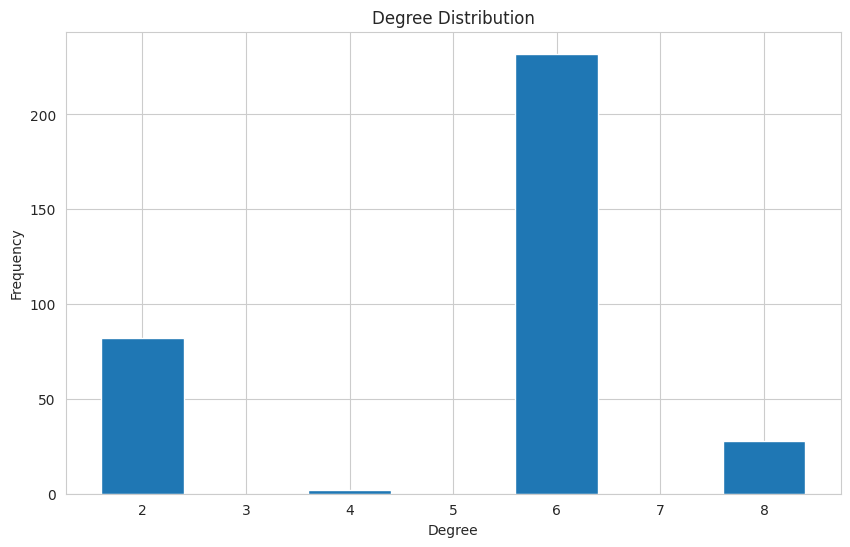

In [32]:
G = graph_dict["Melbourne_Kensington.pkl"]
plot_degree_distribution(G)

# Analyzing patterns

## Intra - city analysis of regions

We can use the location of nodes and thus, the attributes around it to map geographical location and densityof such attributes. For example, here, we divide a city in hexagonal sectors and using a heatmap, display different information.

In [33]:
def plot_density_h3(nodes_attr, edges_attr, resolution=8):
    """
    Plots population density, node density, green view index, and road density using Uber's H3 hexagons.
    
    Parameters:
    nodes_attr (GeoDataFrame): Urbanity nodes containing spatial and population data.
    edges_attr (GeoDataFrame): Urbanity edges containing street-level attributes.
    resolution (int): H3 resolution level (default: 8)
    """
    # Convert node coordinates to H3 hexagons
    nodes_attr['h3_index'] = nodes_attr.geometry.apply(lambda geom: h3.latlng_to_cell(geom.y, geom.x, resolution))
    
    # Population Density
    if 'Men' in nodes_attr and 'Women' in nodes_attr:
        nodes_attr['Total_Pop'] = nodes_attr['Men'] + nodes_attr['Women']
        hex_pop = nodes_attr.groupby('h3_index')['Total_Pop'].sum().reset_index()
        hex_pop['geometry'] = hex_pop['h3_index'].apply(lambda h: Polygon(h3.cell_to_boundary(h)))
        hex_gdf_pop = gpd.GeoDataFrame(hex_pop, geometry='geometry')
    else:
        raise ValueError("Population data (Men and Women) not found in nodes_attr")
    
    # Node Density
    hex_nodes = nodes_attr.groupby('h3_index').size().reset_index(name='Node_Count')
    hex_nodes['geometry'] = hex_nodes['h3_index'].apply(lambda h: Polygon(h3.cell_to_boundary(h)))
    hex_gdf_nodes = gpd.GeoDataFrame(hex_nodes, geometry='geometry')
    
    # Green View Index
    edges_attr['h3_index'] = edges_attr.geometry.apply(lambda geom: h3.latlng_to_cell(geom.centroid.y, geom.centroid.x, resolution))
    hex_gvi = edges_attr.groupby('h3_index')['Green View Mean'].mean().reset_index()
    hex_gvi['geometry'] = hex_gvi['h3_index'].apply(lambda h: Polygon(h3.cell_to_boundary(h)))
    hex_gdf_gvi = gpd.GeoDataFrame(hex_gvi, geometry='geometry')
    
    # Road Density (Total Road Length per Hexagon)
    edges_attr['road_length'] = edges_attr.length  # Compute road length per edge
    hex_road = edges_attr.groupby('h3_index')['road_length'].sum().reset_index()
    hex_road['geometry'] = hex_road['h3_index'].apply(lambda h: Polygon(h3.cell_to_boundary(h)))
    hex_gdf_road = gpd.GeoDataFrame(hex_road, geometry='geometry')
    
    # Plot in a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    hex_gdf_pop.plot(column='Total_Pop', cmap='OrRd', linewidth=0.5, edgecolor='black', alpha=0.8, legend=True, ax=axes[0, 0])
    axes[0, 0].set_title('Population Density Map (using H3 Grid)', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    hex_gdf_nodes.plot(column='Node_Count', cmap='Blues', linewidth=0.5, edgecolor='black', alpha=0.8, legend=True, ax=axes[0, 1])
    axes[0, 1].set_title('Node Density Map (using H3 Grid)', fontsize=14, fontweight='bold')
    axes[0, 1].axis('off')
    
    hex_gdf_gvi.plot(column='Green View Mean', cmap='Greens', linewidth=0.5, edgecolor='black', alpha=0.8, legend=True, ax=axes[1, 0])
    axes[1, 0].set_title('Green View Index (using H3 Grid)', fontsize=14, fontweight='bold')
    axes[1, 0].axis('off')
    
    hex_gdf_road.plot(column='road_length', cmap='Purples', linewidth=0.5, edgecolor='black', alpha=0.8, legend=True, ax=axes[1, 1])
    axes[1, 1].set_title('Road Density Map (using H3 Grid)', fontsize=14, fontweight='bold')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage (assuming nodes_attr and edges_attr are GeoDataFrames from Urbanity)
# plot_density_h3(nodes_attr, edges_attr)

In [6]:
# use both node and edges file (of any city)
df_nodes = gpd.read_file("data/Tokyo_nodes_100m.geojson")
df_edges = gpd.read_file("data/Tokyo_edges_100m.geojson")
plot_density_h3(df_nodes, df_edges)

NameError: name 'plot_density_h3' is not defined

## Thematic maps of road intersections

We can perform similar analysis as above for edges and nodes by plotting them on a map. Here, we can see the number of youths at intersections and greenery along the streets for Paris's Louvre subzone

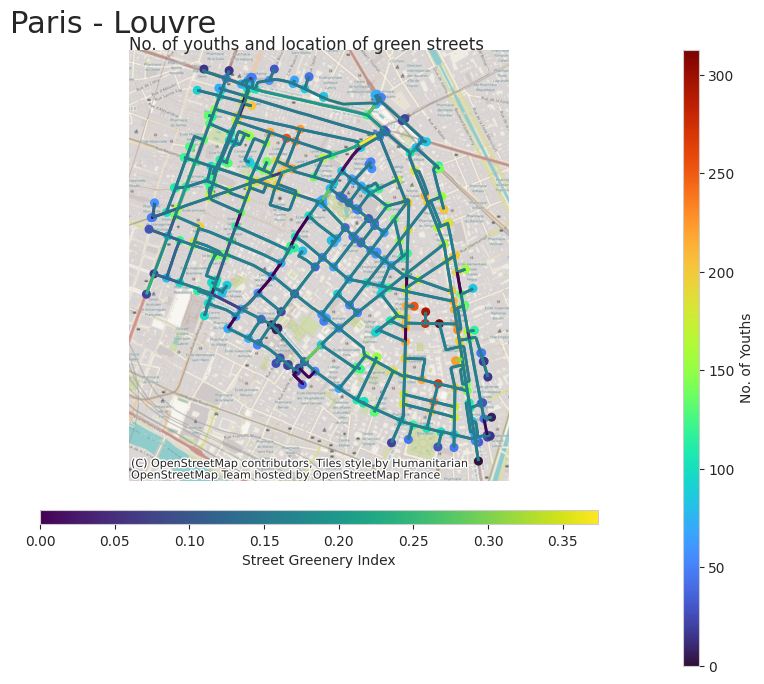

In [ ]:
edge_gdf = gpd.read_file("data/Paris_edges_100m.geojson")
city_computed_metadata = pickle.load(open("saved_data/Paris_Louvre.pkl", "rb"))
network, intersection, streets = city_computed_metadata[
    'network'], city_computed_metadata['intersection'], city_computed_metadata[
        'street']
fig, ax = plt.subplots(figsize=(15,8))
intersection.plot(column = 'Youth',
                  ax=ax, cmap='turbo',
                  markersize=30,
                  legend=True,
                  legend_kwds={'label': "No. of Youths",
                             'orientation': "vertical",
                             'shrink': 1,
                             'anchor':(-1, 0.7),
                             'aspect':40}
                 )
streets.plot(column = 'street_mean_GreenView',
             ax=ax, cmap='viridis',
             linewidth=2,
             legend=True,
             legend_kwds={'label': "Street Greenery Index",
                             'orientation': "horizontal",
                             'shrink': 0.6,
                             'anchor':(0.5, 1.8),
                             'aspect':40,
                             'ticks':None})

# Add title and subtitles
ax.set_title('No. of youths and location of green streets', fontsize=12, loc='left', pad=0)
fig.suptitle('Paris - Louvre', fontsize=22, x=0.229, y = 0.93, horizontalalignment='left')
ctx.add_basemap(ax, crs=edge_gdf.crs)
ax.set_axis_off()
plt.show()

## Spatial Visualization & Thematic Maps of streets

We can also use the edges to identify hotspots across the city for particular attributes. Here, we can see the greenery view along the streets in the Bgota city's subzone

In [ ]:
# Plot street geometry with color representing a chosen attribute
edge_gdf = gpd.read_file("data/Bogota_edges_100m.geojson")
city_computed_metadata = pickle.load(open("saved_data/Bogota_Suba.pkl", "rb"))
network, intersection, streets = city_computed_metadata[
    'network'], city_computed_metadata['intersection'], city_computed_metadata[
        'street']

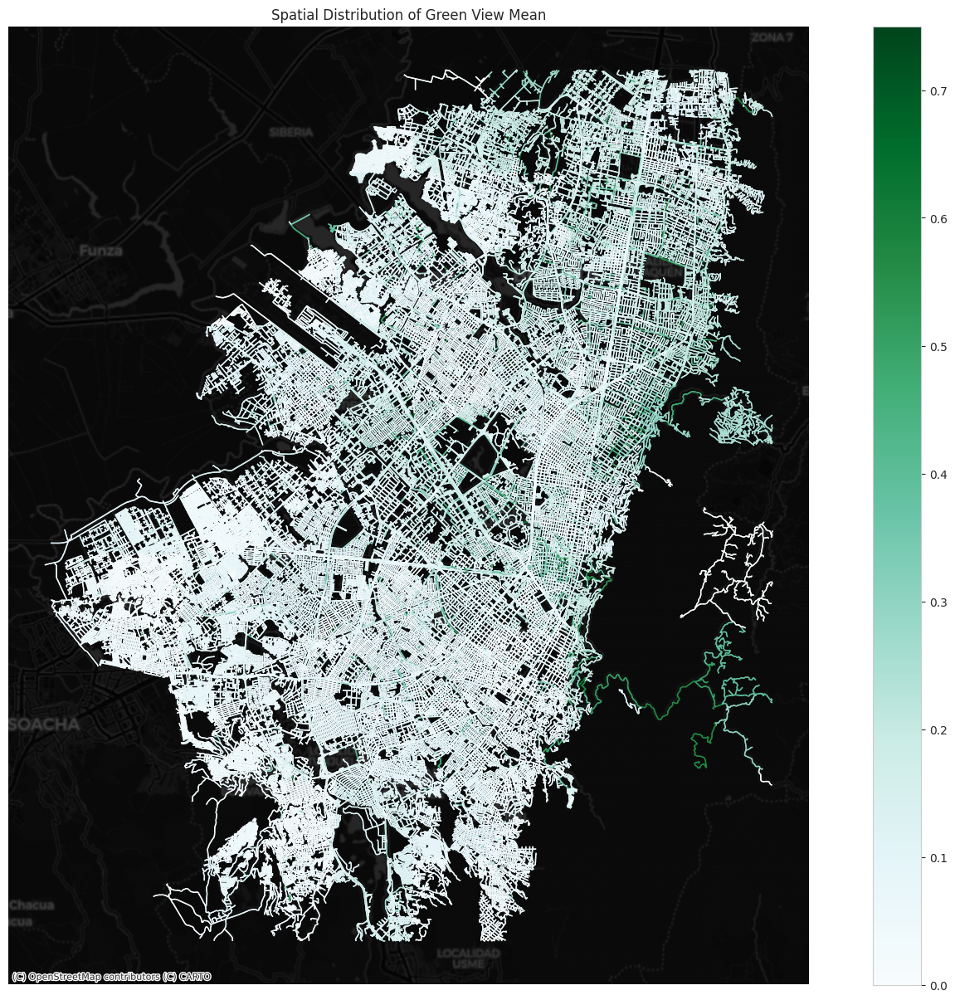

In [ ]:
attr = "Green View Mean"
# attr = "street_mean_GreenView"

fig, ax = plt.subplots(figsize=(20, 15))
edge_gdf.plot(ax=ax,
              column=attr,
              cmap="greens",
              legend=True,
              linewidth=1,
              alpha=1)
ctx.add_basemap(ax, crs=edge_gdf.crs, source=ctx.providers.CartoDB.DarkMatter)
ax.set_title(f"Spatial Distribution of {attr}")
ax.axis("off")
plt.show()

We can see that in the main city, the green view is very low. ie. roadsides don't have a lot of greenery. Most of the green is near the right borders, some around highways, and on the streets connecting the city to other cities

### Clustering based on features

We can cluster edges (and nodes) using their features to find similarities among them. Here, we cluster edges using 4 attributes and see if there are any similarities in the clustered data

In [ ]:
# K-Means Clustering for Descriptive Patterns
cluster_features = ["length", "Green View Mean", "Visual Complexity Mean"]
X = edge_gdf[cluster_features].fillna(0)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=4, random_state=42)
edge_gdf["cluster"] = kmeans.fit_predict(X_scaled)

edge_gdf["cluster"].value_counts()

cluster
3    139764
2     53074
1     43129
0      2391
Name: count, dtype: int64

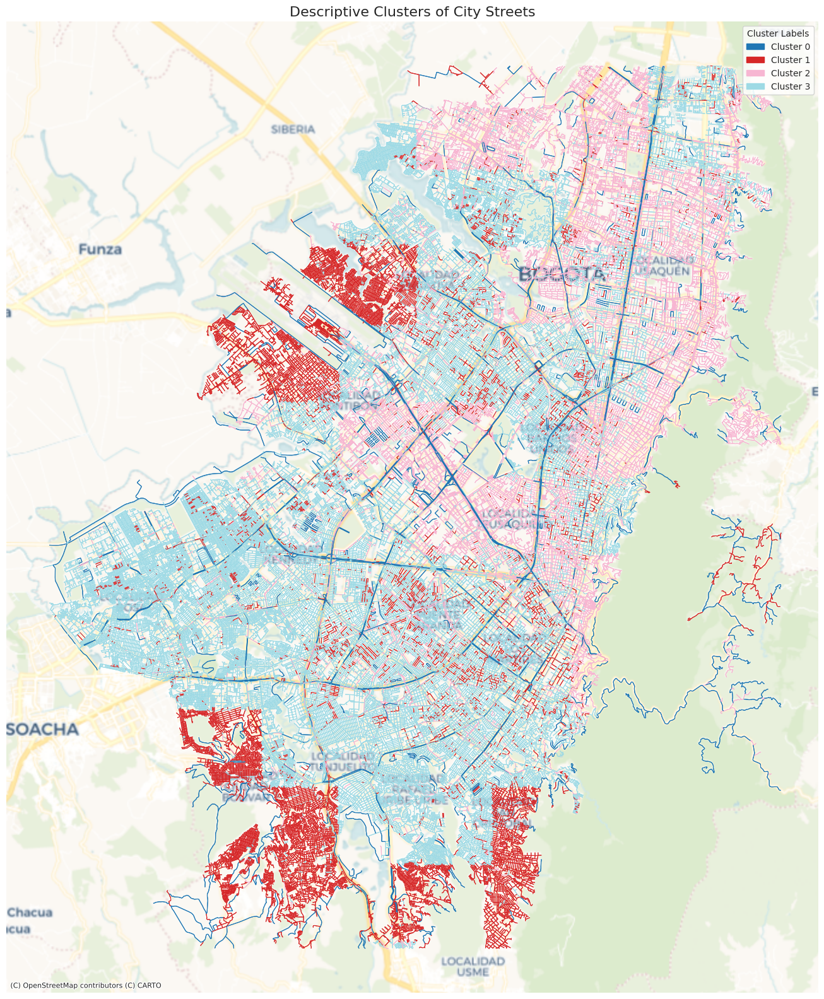

In [ ]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots(figsize=(22, 20))

edge_gdf.plot(
    ax=ax,
    column="cluster",
    categorical=True,
    legend=True,
    cmap="tab20",
    linewidth=0.8,
    alpha=1
)

ctx.add_basemap(ax, crs=edge_gdf.crs, source=ctx.providers.CartoDB.Voyager)

ax.set_title("Descriptive Clusters of City Streets", fontsize=16)
ax.axis('off')

cluster_labels = sorted(edge_gdf["cluster"].unique())
num_clusters = len(cluster_labels)
cmap = plt.get_cmap("tab20", num_clusters)
colors = [cmap(i) for i in range(num_clusters)]

legend_patches = [mpatches.Patch(color=colors[i], label=f"Cluster {cluster_labels[i]}") for i in range(num_clusters)]
ax.legend(handles=legend_patches, title="Cluster Labels", loc="upper right")

plt.show()


We can see that the red streets are short and near the boundaries, light blue are towards bottom left, pink towards top right and long highwaysre dark blue

## Comparing subzones of the city

We can also extend our analysis to an intra-city (inter subzone) level and also inter city level

In [ ]:
# use subzone file of any city
df_subzone = gpd.read_file("data/Tokyo_subzone.geojson")

In [ ]:
def plot_all_metrics(nodes_attr):
    """
    Plots multiple urban metrics using a 3x3 grid of choropleth maps with different colormaps.
    
    Parameters:
    nodes_attr (GeoDataFrame): Urbanity nodes containing spatial data.
    """
    topics = [
        ('Area (km2)', 'Area', 'Reds'),
        ('Node density (km2)', 'Intersection Density', 'viridis'),
        ('Building Footprint (Proportion)', 'Building Footprint Proportion', 'coolwarm'),
        ('PopSum', 'Total Population', 'terrain'),
        ('Elderly', 'Total Older Adults', 'jet'),
        ('Commercial', 'No. of Commercial Amenities', 'YlGnBu'),
        ('Entertainment', 'No. of Entertainment Amenities', 'rainbow'),
        ('Food', 'No. of Food Amenities', 'PuBu'),
        ('Healthcare', 'No. of Healthcare Amenities', 'Reds')
    ]
    
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.subplots_adjust(hspace=0.3, wspace=0.3)
    
    for ax, (column, title, cmap) in zip(axes.flatten(), topics):
        nodes_attr.plot(column=column, cmap=cmap, linewidth=0.5, edgecolor='black', alpha=0.8, legend=True, ax=ax)
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.axis('off')
    
    plt.show()


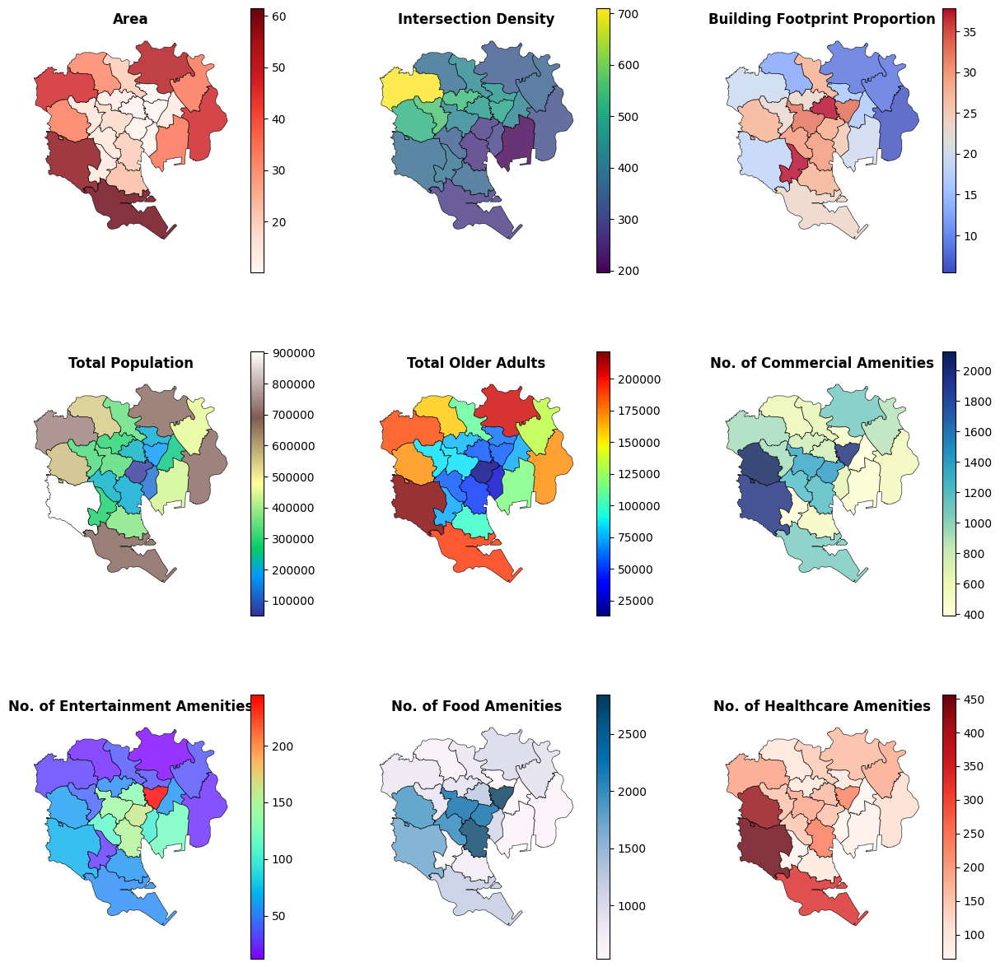

In [ ]:
plot_all_metrics(df_subzone)

## Analyzing graph communities

We can also leverage community identification in graphs for a similar analysis and to cluster different regions in a location based on graph features

In [ ]:
chicago_subzones = {k:v for k,v in graph_dict.items() if 'Chicago' in k}
edge_gdf = gpd.read_file("data/Chicago_edges_100m.geojson")

In [ ]:
community_dict = {}
modularity_dict = {}
for city_subzone, network in list(graph_dict.items()):
    modularity, num_communities, results = community_utils.detect_communities(network, algorithm="louvain")
    modularity_dict[city_subzone] = modularity
    community_dict[city_subzone] = results
    print(
        f"Modularity for {city_subzone.split('_')[0]} - {city_subzone.split('_')[1]}",
        modularity, f"Number of communities: {num_communities}")

Modularity for Melbourne - St Kilda.pkl 0.8471417230089093 Number of communities: 17
Modularity for Brisbane - Racecourse precinct neighbourhood plan.pkl 0.9146263551372198 Number of communities: 29
Modularity for Chicago - Rush & Division.pkl 0.8038499379042274 Number of communities: 11
Modularity for Brisbane - Toombul—Nundah neighbourhood plan.pkl 0.9155211822034571 Number of communities: 26
Modularity for Melbourne - Moonee Ponds.pkl 0.8426663414988508 Number of communities: 15
Modularity for Chicago - Wrigleyville.pkl 0.8086643763810262 Number of communities: 12
Modularity for Amsterdam - Spieringhorn.pkl 0.7611765312169857 Number of communities: 11
Modularity for Chicago - Jefferson Park.pkl 0.8103820906114418 Number of communities: 14
Modularity for Amsterdam - Sloten- en Riekerpolder.pkl 0.7623102888505243 Number of communities: 11
Modularity for Melbourne - Seddon.pkl 0.8467992590324872 Number of communities: 16
Modularity for Budapest - Budapest XX. kerület.pkl 0.873898220615

In [ ]:
edge_gdf = gpd.read_file("data/Brisbane_edges_100m.geojson")

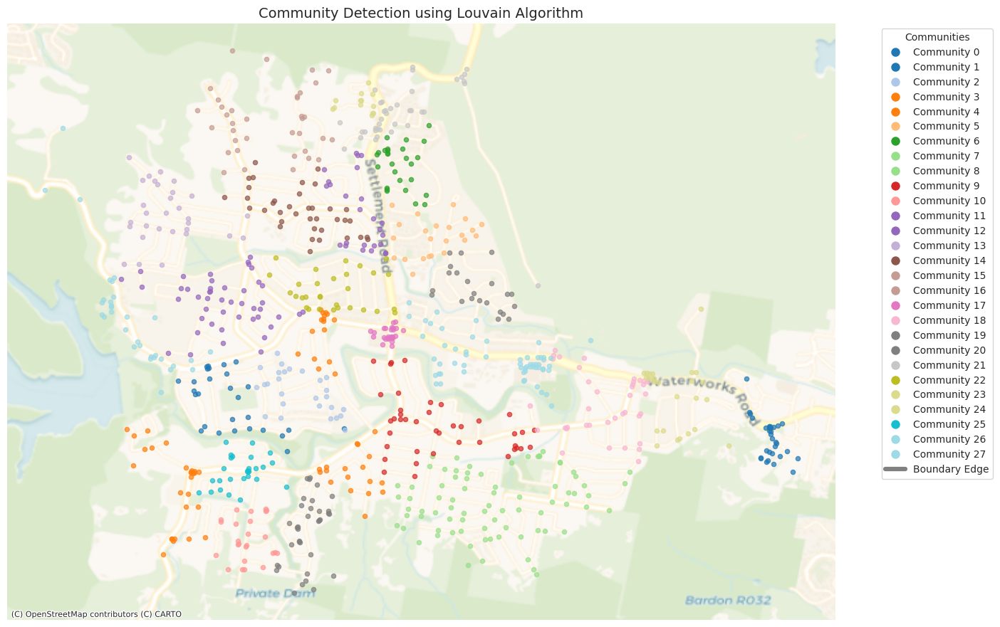

<Figure size 640x480 with 0 Axes>

In [ ]:
fig, ax = community_utils.visualize_communities(
    *community_dict["Brisbane_Pinkenba—Eagle Farm neighbourhood plan.pkl"][1:],
    title="Community Detection using Louvain Algorithm",
    show=False,
    max_communities_legend=50)
ctx.add_basemap(ax, crs=edge_gdf.crs, source=ctx.providers.CartoDB.Voyager)
display(fig)

Communities are formed by graph attributes of nearby nodes such as degree, distance from other nodes etc. We can see that in this city (and others), the communities formed by street intersections are geographically close by, allowing us to separate our insights by communities

### Checking community supernodes

Smaller nodes in communities can be combined to represent them as a supernode

Original Graph Nodes: 862
Original Graph Edges: 2032
Super-Graph Nodes: 28
Super-Graph Edges: 37


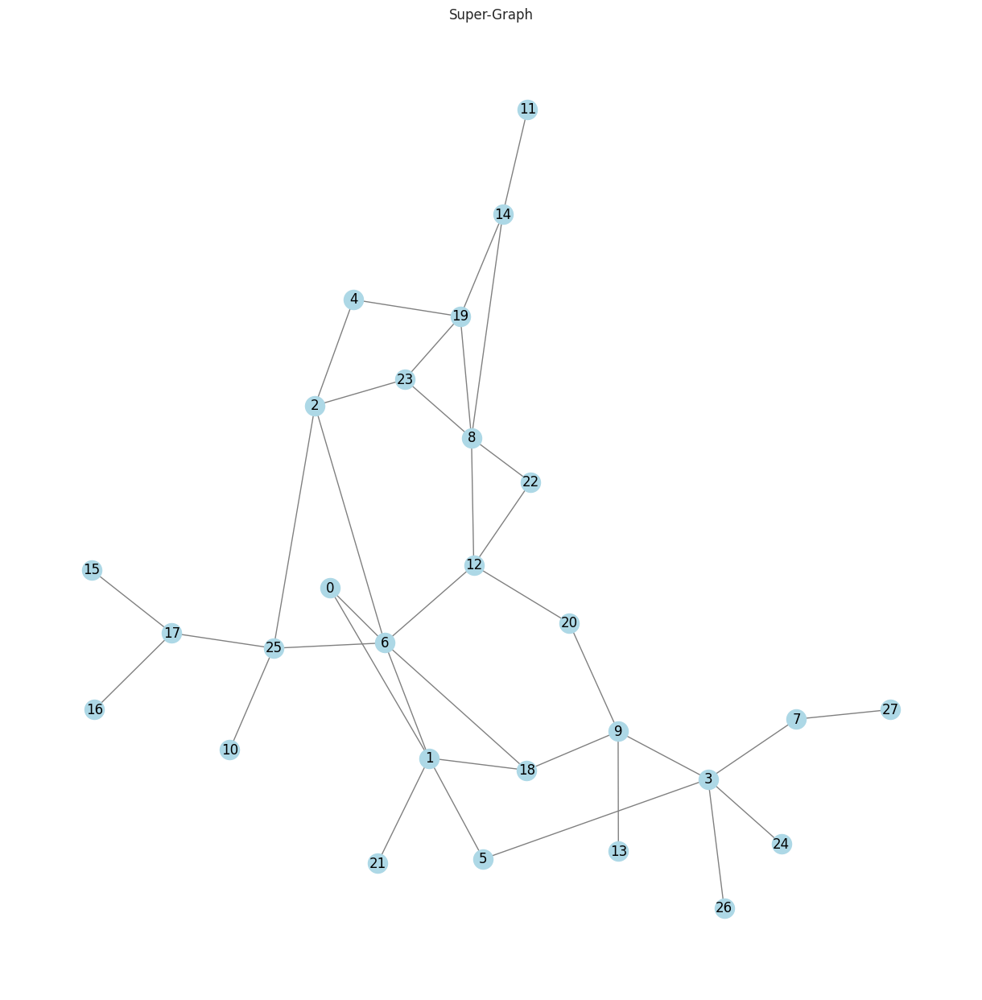

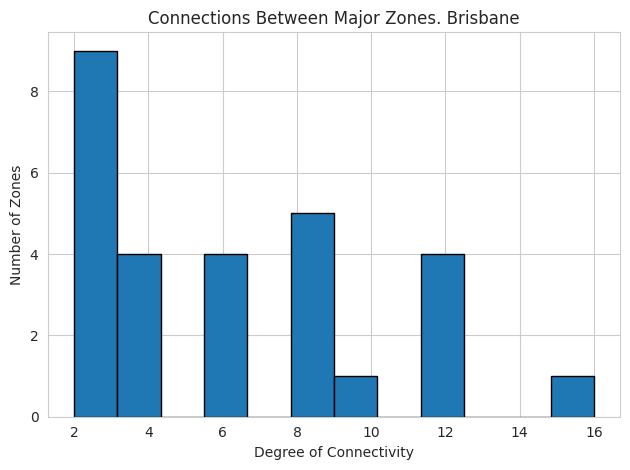

In [36]:
analyze_supergraph(graph_dict["Brisbane_Pinkenba—Eagle Farm neighbourhood plan.pkl"], "Brisbane")

We can see that we can use community statistics to convert the city intersection regions into supernodes, where intersections in a supernode have similar attributes

## Multi-City Comparative Analysis

We can use features and techniques seen above to perform inter city analysis

In [ ]:
import os
import glob
import geopandas as gpd

folder_path = "data/"
pattern = os.path.join(folder_path, "*_edges_*.geojson")
print(f"Scanning for edge files: {pattern}")

city_files = glob.glob(pattern)
cities = {}

for path in city_files:
    fname = os.path.basename(path)
    city_name = fname.split("_edges_")[0]
    try:
        gdf = gpd.read_file(path)
        gdf.dropna(subset=["geometry"], inplace=True)
        
        # Fix: Assign fillna() result back instead of using inplace=True
        numeric_cols = gdf.select_dtypes(include=["float", "int"]).columns
        for col in numeric_cols:
            gdf[col] = gdf[col].fillna(gdf[col].median())
        
        cities[city_name] = gdf
        print(f"Loaded {city_name}: {len(gdf)} edges")
    except Exception as e:
        print(f"Error loading {path}: {e}")

print(f"\nTotal cities loaded: {len(cities)}")
list(cities.keys())


In [41]:
cities = {k:v for k,v in cities.items() if np.random.random() < 0.5}
len(cities)

10

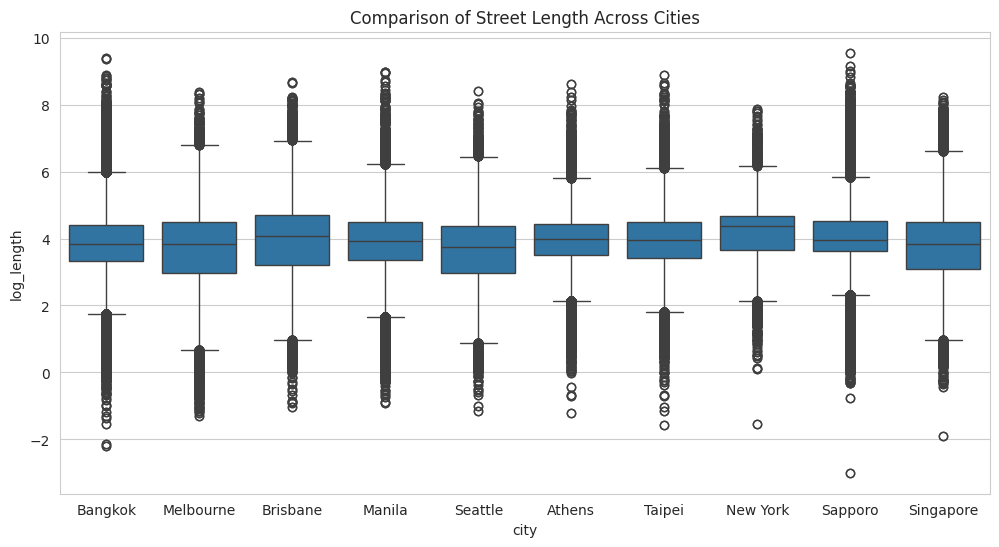

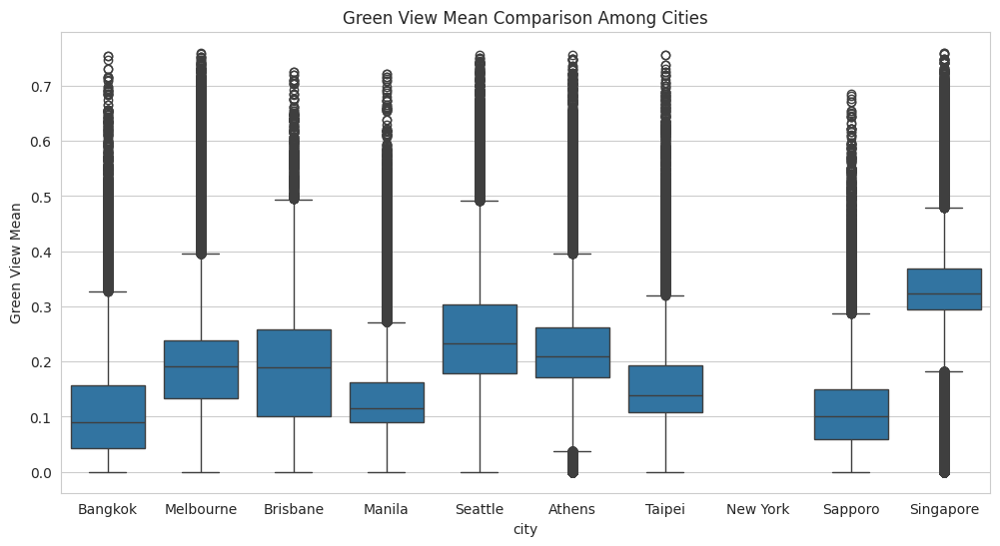

In [ ]:
all_edges = pd.DataFrame()
for city, gdf in cities.items():
    tmp = gdf.copy()
    tmp["city"] = city
    all_edges = pd.concat([all_edges, tmp], ignore_index=True)

all_edges["log_length"] = np.log(all_edges["length"])
plt.figure(figsize=(12, 6))
sns.boxplot(x="city", y="log_length", data=all_edges)
plt.title("Comparison of Street Length Across Cities")
plt.show()

if "Green View Mean" in all_edges.columns:
    plt.figure(figsize=(12,6))
    sns.boxplot(x="city", y="Green View Mean", data=all_edges)
    plt.title("Green View Mean Comparison Among Cities")
    plt.show()

### Multivariate Analysis (PCA & Clustering) Across Cities

Missing Features: ['footprint_mean']


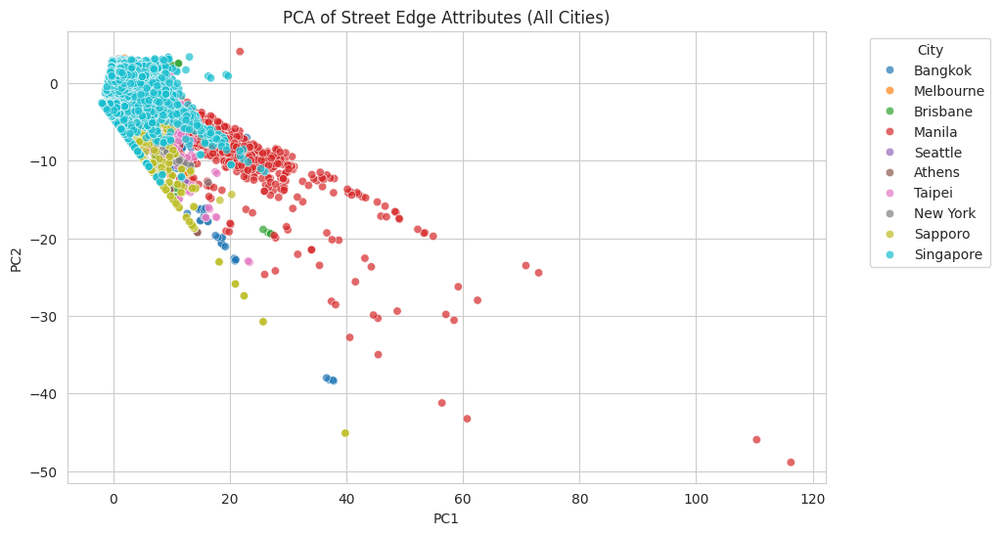

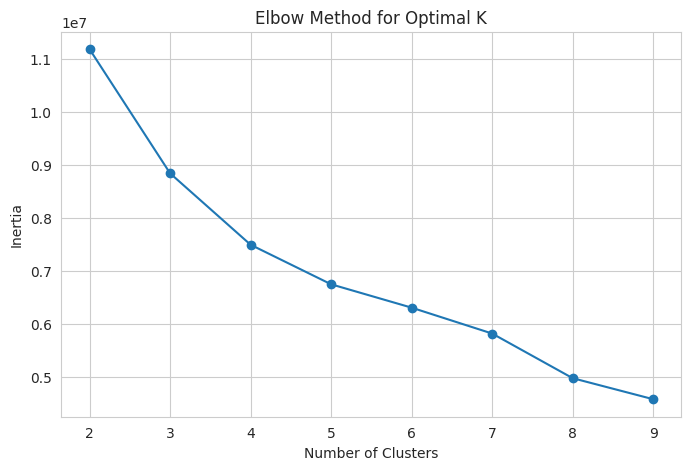

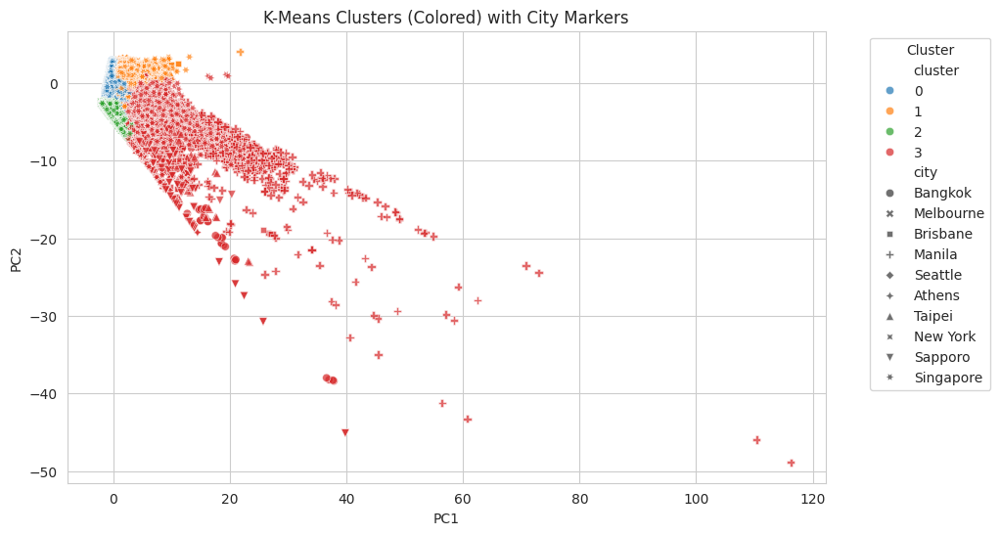

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import warnings 

# Ignore warnings
warnings.filterwarnings("ignore")

analysis_features = [
    "length",
    "Building Count",  
    "footprint_mean",
    "Complexity Mean",
    "PopSum",
    "Green View Mean",
    "Visual Complexity Mean"
]

# Check for missing features
missing_features = [f for f in analysis_features if f not in all_edges.columns]
print("Missing Features:", missing_features)

# Select only available features
analysis_features = [f for f in analysis_features if f in all_edges.columns]
X = all_edges[analysis_features].fillna(0)

# Scale data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA
pca = PCA(n_components=2)
pca_values = pca.fit_transform(X_scaled)
all_edges["PC1"] = pca_values[:, 0]
all_edges["PC2"] = pca_values[:, 1]


plt.figure(figsize=(10,6))
sns.scatterplot(data=all_edges, x="PC1", y="PC2", hue="city", alpha=0.7)
plt.title("PCA of Street Edge Attributes (All Cities)")

# Move legend outside the plot
plt.legend(title="City", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Finding optimal K (Elbow Method)
inertia = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(range(2, 10), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()

# K-Means Clustering with 4 Clusters
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
all_edges["cluster"] = kmeans.fit_predict(X_scaled)
cluster_palette = sns.color_palette("tab10", optimal_k)  

# Cluster Plot 
plt.figure(figsize=(10,6))
sns.scatterplot(data=all_edges, x="PC1", y="PC2", hue="cluster", style="city", palette=cluster_palette, alpha=0.7)
plt.title("K-Means Clusters (Colored) with City Markers")

# legend 
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


# Frequent itemsets for nodes

In [1]:
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

In [4]:
graph_df = gpd.read_file("data/Tokyo_nodes_100m.geojson")
graph_df = graph_df.fillna(0)
graph_df = graph_df.drop(columns=["geometry"])

In [5]:
graph_df = graph_df[['Civic', 'Commercial', 'Entertainment', 'Food',
                     'Healthcare', 'Institutional', 'Recreational', 'Social']]

In [6]:
graph_df.head()

,Civic,Commercial,Entertainment,Food,Healthcare,Institutional,Recreational,Social
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,3.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
graph_df.shape

(241308, 8)

In [8]:
# Step 1: Binarize the counts (any count > 0 becomes 1)
df_binary = graph_df.gt(0).astype(int)
# print(df_binary.head())
# Step 2: Run Apriori to get frequent itemsets
frequent_itemsets = apriori(df_binary, min_support=0.05, use_colnames=True)
# print(frequent_itemsets.head())
# Step 3: Generate association rules
rules = association_rules(
    frequent_itemsets, metric="confidence", min_threshold=0.5)

# Show results
print("Frequent Itemsets:")
print(frequent_itemsets)

/home/srg/projects/urbanity/.venv/lib/python3.10/site-packages/mlxtend/frequent_patterns/fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


Frequent Itemsets:
     support                                      itemsets
0   0.129552                                       (Civic)
1   0.387691                                  (Commercial)
2   0.050069                               (Entertainment)
3   0.345401                                        (Food)
4   0.162916                                  (Healthcare)
5   0.185700                               (Institutional)
6   0.381210                                (Recreational)
7   0.103474                                      (Social)
8   0.083594                           (Civic, Commercial)
9   0.077805                                 (Civic, Food)
10  0.056695                         (Civic, Recreational)
11  0.261127                            (Food, Commercial)
12  0.126448                      (Healthcare, Commercial)
13  0.073790                   (Institutional, Commercial)
14  0.169920                    (Recreational, Commercial)
15  0.050968                         

In [9]:
print("\nAssociation Rules:")
rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']]


Association Rules:


,antecedents,consequents,support,confidence,lift
0,(Civic),(Commercial),0.083594,0.645256,1.664356
1,(Civic),(Food),0.077805,0.600569,1.738760
2,(Food),(Commercial),0.261127,0.756011,1.950034
3,(Commercial),(Food),0.261127,0.673543,1.950034
4,(Healthcare),(Commercial),0.126448,0.776155,2.001994
5,(Healthcare),(Food),0.120261,0.738178,2.137164
6,"(Civic, Food)",(Commercial),0.066367,0.852996,2.200194
7,"(Civic, Commercial)",(Food),0.066367,0.793922,2.298553
8,(Civic),"(Food, Commercial)",0.066367,0.512283,1.961818
9,"(Food, Healthcare)",(Commercial),0.108977,0.906168,2.337345


In [10]:
rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(Civic),(Commercial),0.129552,0.387691,0.083594,0.645256,1.664356,1.0,0.033368,1.726059,0.458577,0.192770,0.420646,0.430439
1,(Civic),(Food),0.129552,0.345401,0.077805,0.600569,1.738760,1.0,0.033058,1.638831,0.488114,0.195910,0.389809,0.412915
2,(Food),(Commercial),0.345401,0.387691,0.261127,0.756011,1.950034,1.0,0.127218,2.509575,0.744254,0.553276,0.601526,0.714777
3,(Commercial),(Food),0.387691,0.345401,0.261127,0.673543,1.950034,1.0,0.127218,2.005164,0.795658,0.553276,0.501288,0.714777
4,(Healthcare),(Commercial),0.162916,0.387691,0.126448,0.776155,2.001994,1.0,0.063287,2.735420,0.597907,0.298115,0.634425,0.551156


/tmp/ipykernel_14014/1295272768.py:66: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, width=edge_weights, edge_color=[sm.to_rgba(w) for w in edge_weights], alpha=0.9)


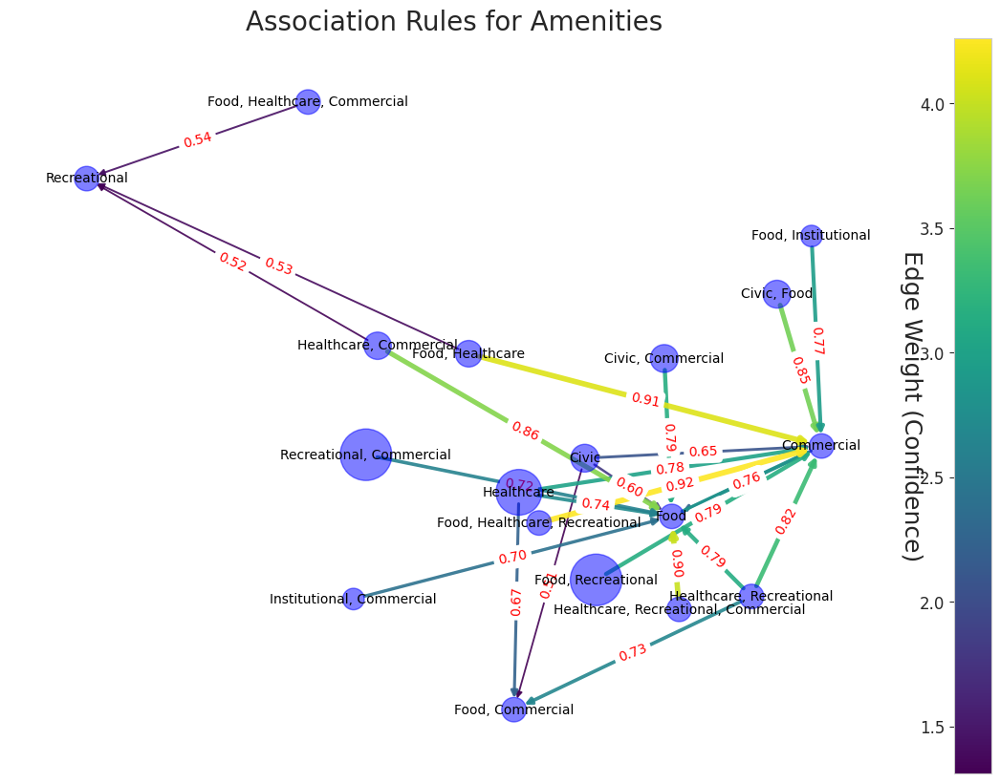

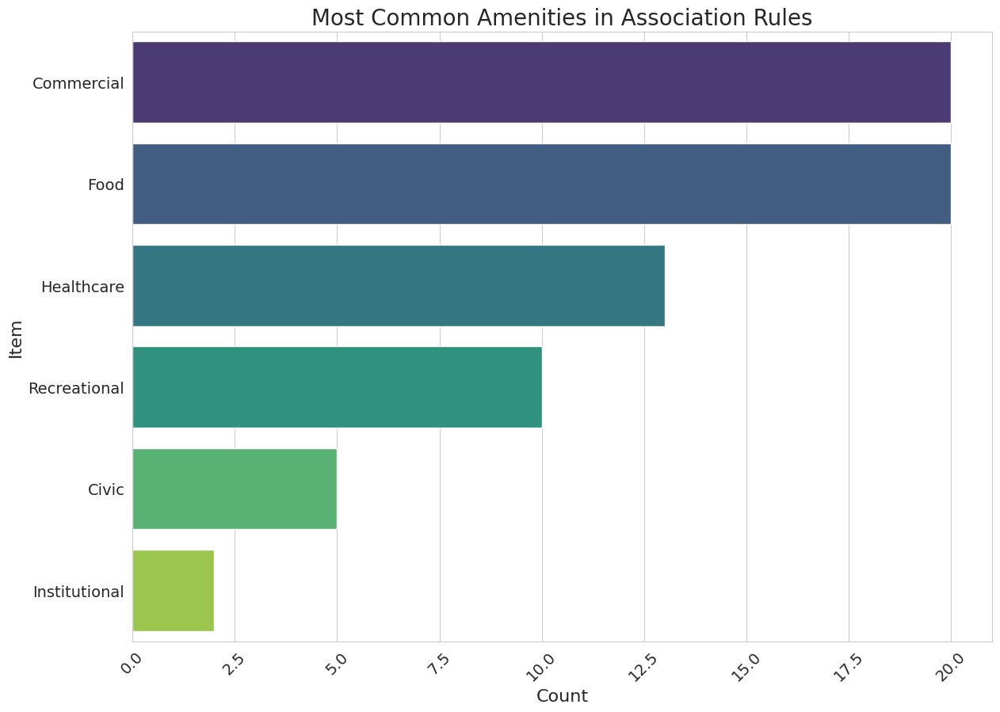

In [ ]:
# Visualize itemsets as a graph with edges of different thickness and apropriate node sizes
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import networkx as nx
from itertools import combinations
from matplotlib import cm
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.colors import to_rgba
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib import gridspec
from matplotlib import rcParams
from matplotlib import rc

# Set font properties
rc('font', family='sans-serif')
rc('text', usetex=False)
rcParams['axes.titlesize'] = 20
rcParams['axes.labelsize'] = 18
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 24
   

def plot_association_rules(rules, title="Association Rules", figsize=(15, 10)):
    """
    Plot association rules as a network graph.
    
    Parameters:
    rules (DataFrame): DataFrame containing association rules.
    title (str): Title of the plot.
    figsize (tuple): Size of the figure.
    """
    # Create a graph from the rules
    G = nx.DiGraph()
    
    # Add nodes and edges
    for _, row in rules.iterrows():
        antecedents = frozenset(row['antecedents'])
        consequents = frozenset(row['consequents'])
        support = row['support']
        confidence = row['confidence']
        antecedents = ', '.join(antecedents)
        consequents = ', '.join(consequents)
        G.add_node(antecedents, size=support)
        G.add_node(consequents, size=support)
        G.add_edge(antecedents, consequents, weight=confidence)
    
    # Get node sizes
    node_sizes = [(G.nodes[node]['size'] ** 2)*100000 for node in G.nodes()]
    # Get edge weights
    edge_weights = [(G.edges[edge]['weight']**2)*5 for edge in G.edges()]
    # Create a color map based on edge weights
    norm = Normalize(vmin=min(edge_weights), vmax=max(edge_weights))
    sm = ScalarMappable(cmap='viridis', norm=norm)
    
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=figsize)
    
    # Draw the graph
    pos = nx.spring_layout(G, k=3/math.sqrt(G.order()))
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='blue', alpha=0.5)
    nx.draw_networkx_edges(G, pos, width=edge_weights, edge_color=[sm.to_rgba(w) for w in edge_weights], alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')
    nx.draw_networkx_edge_labels(G, pos, edge_labels={(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)}, font_color='red')
    sm.set_array([])
    sm.set_clim(min(edge_weights), max(edge_weights))
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Edge Weight (Confidence)', rotation=270, labelpad=15)
    cbar.ax.yaxis.set_label_position('left')
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.yaxis.set_ticks_position('left')

    # Set title and labels
    ax.set_title(title, fontsize=20)
    # ax.set_xlabel('Antecedents', fontsize=16)
    # ax.set_ylabel('Consequents', fontsize=16)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    # plt.tight_layout()

    plt.show()


# Plotting the most common amenities
def plot_most_common_amenities(rules, title="Most Common Amenities", figsize=(14, 10)):
    """
    Plot the most common amenities from the association rules.
    
    Parameters:
    rules (DataFrame): DataFrame containing association rules.
    title (str): Title of the plot.
    figsize (tuple): Size of the figure.
    """
    # Flatten the antecedents and consequents
    all_items = []
    for _, row in rules.iterrows():
        all_items.extend(row['antecedents'])
        all_items.extend(row['consequents'])
    
    # Count occurrences of each item
    item_counts = Counter(all_items)
    
    # Create a DataFrame from the counts
    item_df = pd.DataFrame(item_counts.items(), columns=['Item', 'Count'])
    
    # Sort by count
    item_df = item_df.sort_values(by='Count', ascending=False)#.head(10)
    
    # Plot
    plt.figure(figsize=figsize)
    sns.barplot(x='Count', y='Item', data=item_df, palette='viridis')
    plt.title(title, fontsize=20)
    plt.xlabel('Count', fontsize=16)
    plt.ylabel('Item', fontsize=16)
    plt.xticks(rotation=45)
    # plt.tight_layout()
    plt.show()


plot_association_rules(rules, title="Association Rules for Amenities")
plot_most_common_amenities(rules, title="Most Common Amenities in Association Rules")

Nodes: ['Civic', 'Commercial', 'Food', 'Healthcare', 'Institutional', 'Recreational']
Edges: [('Civic', 'Commercial', {'weight': 0.6307046983439051}), ('Civic', 'Food', {'weight': 0.6047645540717559}), ('Commercial', 'Food', {'weight': 0.8153270494769522}), ('Commercial', 'Recreational', {'weight': 0.5259028154898848}), ('Food', 'Commercial', {'weight': 0.8624323375364922}), ('Food', 'Recreational', {'weight': 0.5310390785457757}), ('Healthcare', 'Commercial', {'weight': 0.792134796270647}), ('Healthcare', 'Food', {'weight': 0.7795846200463664}), ('Healthcare', 'Recreational', {'weight': 0.5284709470178303}), ('Institutional', 'Commercial', {'weight': 0.7652802669797911}), ('Institutional', 'Food', {'weight': 0.6954397394136809}), ('Recreational', 'Commercial', {'weight': 0.796874467634675}), ('Recreational', 'Food', {'weight': 0.7782279820002553})]
Node sizes:  [319.25247094529414, 4446.806694641685, 4446.806694641685, 1961.4788446098928, 55.981979492208445, 1191.4923520864222]
Edge w

/tmp/ipykernel_14014/386041714.py:56: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(item_graph, pos, width=edge_weights,


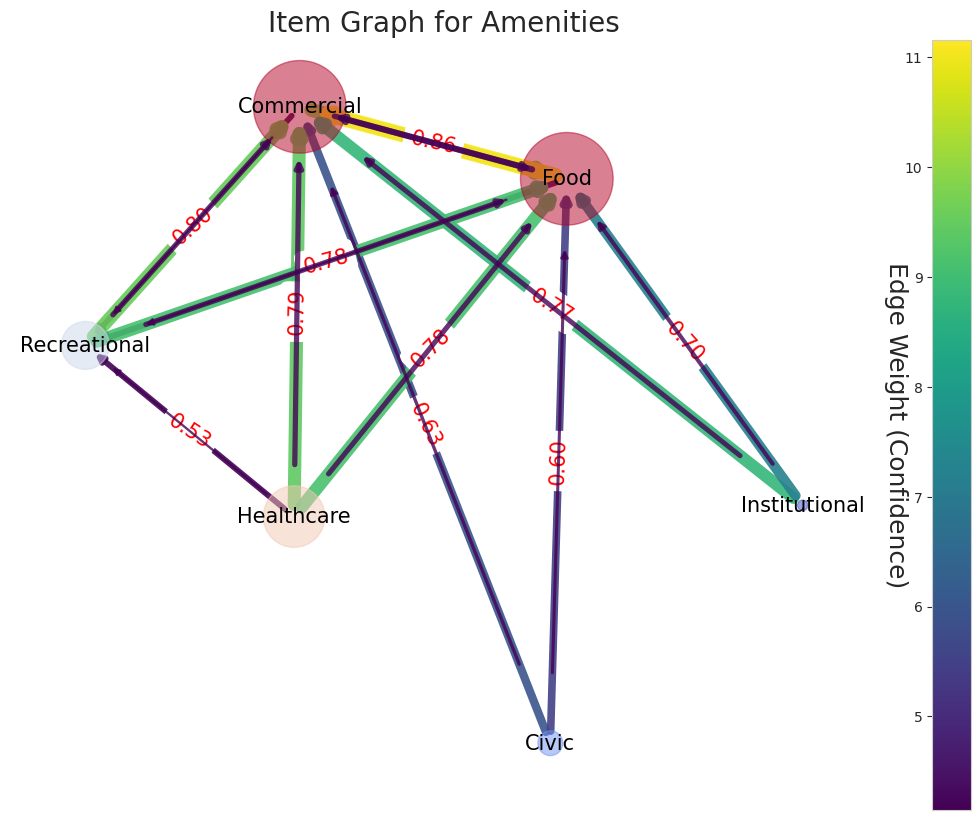

In [46]:
# plot item graph
def plot_item_graph(rules, title="Item Graph", figsize=(14, 10)):
    """
    Plot item graph from association rules.
    """
    item_graph = nx.DiGraph()

    # Add nodes and edges
    for _, row in rules.iterrows():
        antecedents = list(row['antecedents'])
        consequents = list(row['consequents'])
        support = row['support']
        confidence = row['confidence']

        # Add nodes and initialize size (occurrence count)
        for item in antecedents + consequents:
            if item not in item_graph:
                item_graph.add_node(item, size=1)
            else:
                item_graph.nodes[item]['size'] += 1

        # Add edges from each item in antecedents to each in consequents
        for a in antecedents:
            for c in consequents:
                if item_graph.has_edge(a, c):
                    # Optionally average or sum confidence
                    item_graph[a][c]['weight'] = (
                        item_graph[a][c]['weight'] + confidence) / 2
                else:
                    item_graph.add_edge(a, c, weight=confidence)
    print("Nodes:", item_graph.nodes())
    print("Edges:", item_graph.edges(data=True))

    # Get node sizes
    node_sizes = [(item_graph.nodes[node]['size'] ** 1.9) * 15
                   for node in item_graph.nodes()]
    print("Node sizes: ", node_sizes)
    # Get edge weights
    # edge_weights = [(item_graph.edges[edge]['weight'] ** 2)
    #                 * 10 for edge in item_graph.edges()]
    edge_weights = [(item_graph.edges[edge]['weight'] ** 2)*15
                     for edge in item_graph.edges()]

    print("Edge weights: ", edge_weights)

    # Create a color map based on edge weights
    norm = Normalize(vmin=min(edge_weights), vmax=max(edge_weights))
    sm = ScalarMappable(cmap='viridis', norm=norm)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=figsize)
    pos = nx.spring_layout(item_graph, k=0.8, iterations=50)

    node_colors = [item_graph.nodes[n]['size'] for n in item_graph.nodes()]
    nx.draw_networkx_nodes(item_graph, pos, node_size=node_sizes, node_color=node_colors, cmap='coolwarm', alpha=0.5)
    nx.draw_networkx_edges(item_graph, pos, width=edge_weights,
                           edge_color=[sm.to_rgba(w) for w in edge_weights], alpha=0.9)
    for (u, v, d) in item_graph.edges(data=True):
        x1, y1 = pos[u]
        x2, y2 = pos[v]
        weight = d['weight']
        color = sm.to_rgba(weight)

        # Direction vector from u to v
        dx = x2 - x1
        dy = y2 - y1

        # Normalize
        dist = (dx**2 + dy**2) ** 0.5
        if dist == 0:
            continue  # skip if positions are the same

        # Shrink arrow ends to stay outside node circles
        shrink_ratio = 0.12  # fraction of length
        shrink_x = dx * shrink_ratio
        shrink_y = dy * shrink_ratio

        # Arrow thickness based on confidence
        line_width = (weight ** 2) * 6  # tweak multiplier for visual scale

        ax.annotate("",
                    xy=(x2 - shrink_x, y2 - shrink_y),  # arrow tip
                    xytext=(x1 + shrink_x, y1 + shrink_y),  # arrow tail
                    arrowprops=dict(arrowstyle="-|>",
                                    color=color,
                                    lw=line_width,
                                    alpha=0.8),
                )


    nx.draw_networkx_labels(item_graph, pos, font_size=15, font_color='black')
    nx.draw_networkx_edge_labels(item_graph, pos,
                                 edge_labels={
                                     (u, v): f"{d['weight']:.2f}" for u, v, d in item_graph.edges(data=True)},
                                 font_color='red', font_size=15)

    # Color bar
    sm.set_array([])
    sm.set_clim(min(edge_weights), max(edge_weights))
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Edge Weight (Confidence)', rotation=270, labelpad=15)
    cbar.ax.yaxis.set_label_position('left')
    cbar.ax.tick_params(labelsize=10)
    cbar.ax.yaxis.set_ticks_position('left')

    # Clean up axes
    ax.set_title(title, fontsize=20)
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.show()


plot_item_graph(rules, title="Item Graph for Amenities")

354 491


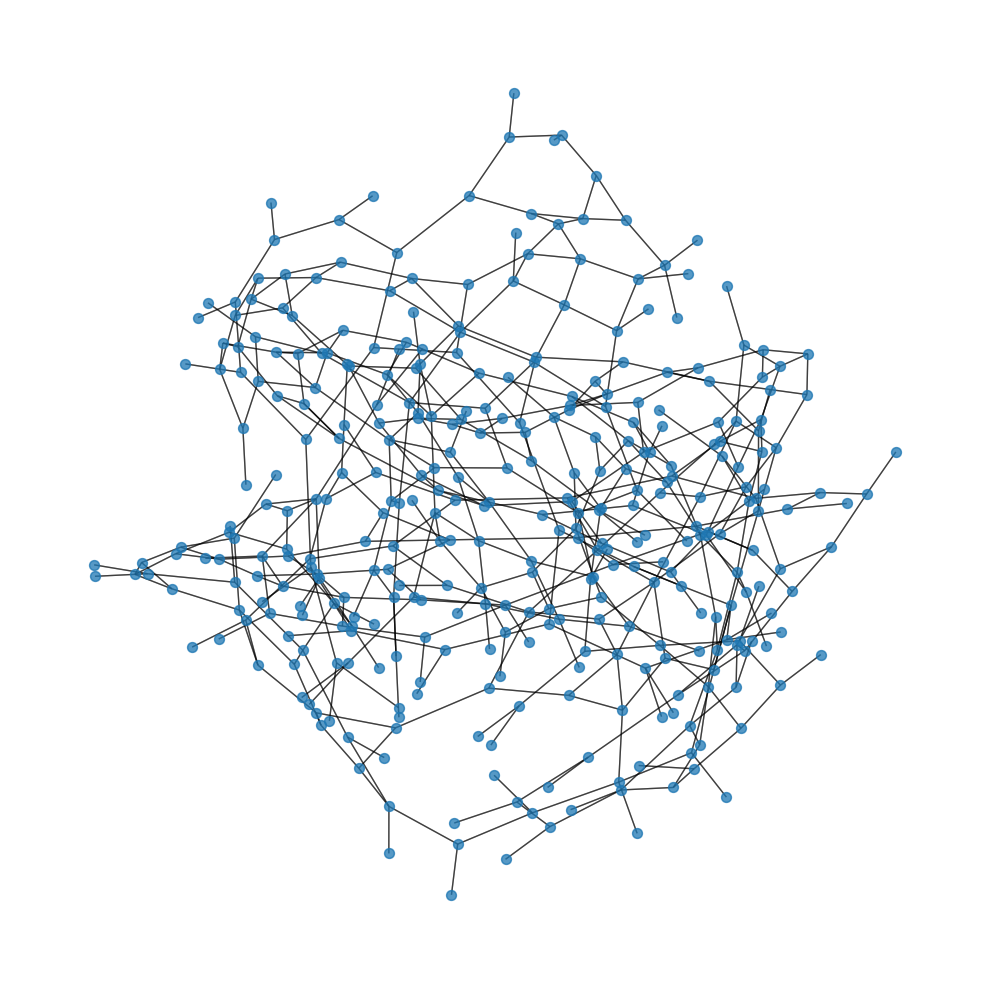

In [72]:
# draw graph G

graph = pickle.load(open("saved_data/Paris_Louvre.pkl", "rb"))['network']
fig, ax = plt.subplots(figsize=(10, 10))
graph = graph.to_undirected()
print(len(graph.nodes()), len(graph.edges()))
graph = graph.subgraph(list(graph.nodes())[:500])
pos = nx.spring_layout(graph, k=0.1, iterations=50)
nx.draw(graph, pos, node_size=50, alpha=0.5)
nx.draw_networkx_nodes(graph, pos, node_size=50, alpha=0.5, cmap="viridis")
nx.draw_networkx_edges(graph, pos, alpha=0.5)
plt.tight_layout()
# plt.title("Amsterdam Network Graph")
plt.show()

# Other visualizations are available in the urbanity package's dashboard which have not been included here

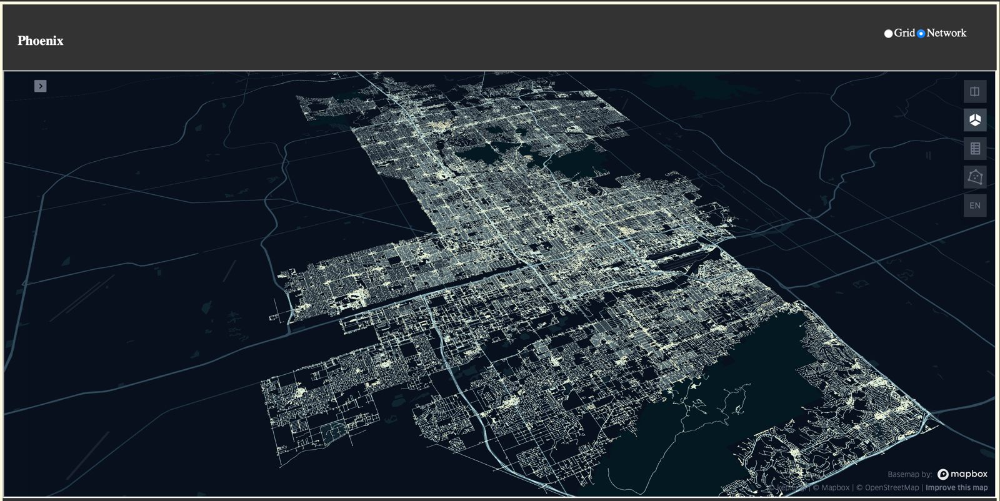

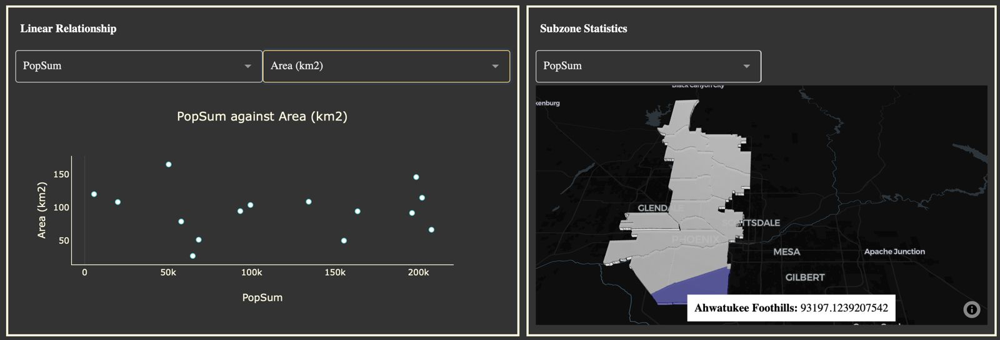

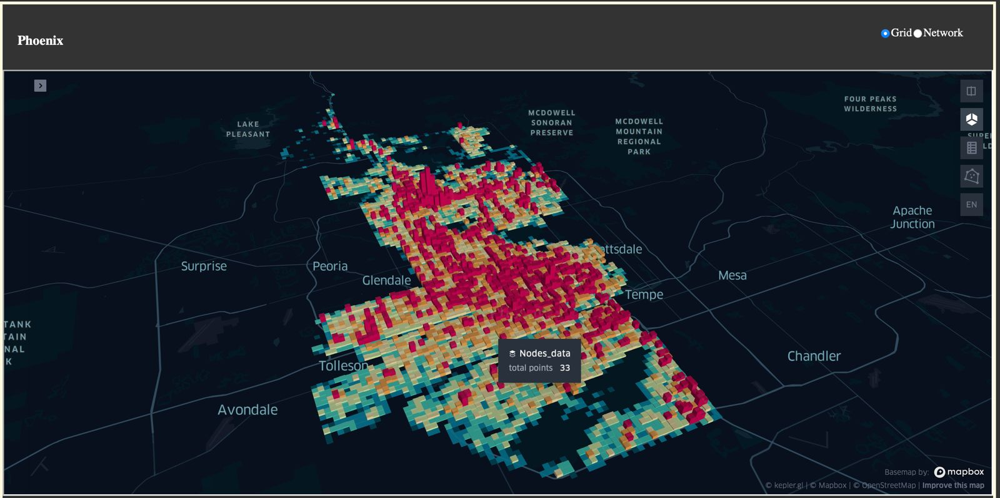